# Exploration (Regression Exercises)

## Exercises

### Info

Our Zillow scenario continues:

As a Codeup data science graduate, you want to show off your skills to the Zillow data science team in hopes of getting an interview for a position you saw pop up on LinkedIn. You thought it might look impressive to build an end-to-end project in which you use some of their Kaggle data to predict property values using some of their available features; who knows, you might even do some feature engineering to blow them away. Your goal is to predict the values of single unit properties using the observations from 2017.

In these exercises, you will run through the stages of exploration as you continue to work toward the above goal.

### 1. 

As with encoded vs. unencoded data, we recommend exploring un-scaled data in your EDA process.

### 2. 

Make sure to perform a train, validate, test split before and use only your train dataset to explore the relationships between independent variables with other independent variables or independent variables with your target variable.

### 3. 

Write a function named plot_variable_pairs that accepts a dataframe as input and plots all of the pairwise relationships along with the regression line for each pair.

In [4]:
from wrangle import wrangle_zillow, check_columns, split_data
from explore import plot_variable_pairs, plot_categorical_and_continuous_vars
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")
plt.style.use(
    "https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle"
)

In [5]:
df = wrangle_zillow()

In [4]:
check_columns(df)

,Column Name,Number of Unique Values,Unique Values,Number of Null Values,Proportion of Null Values,dtype
0,year,153,"[2005, 2011, 1926, 1972, 1973, 1960, 1950, 195...",0,0.0,int64
1,beds,19,"[4, 3, 0, 5, 2, 1, 6, 7, 8, 9, 25, 10, 11, 14,...",0,0.0,int64
2,baths,38,"[2.0, 4.0, 0.0, 1.0, 2.5, 3.5, 3.0, 5.5, 4.5, ...",0,0.0,float64
3,sqfeet,10557,"[3633, 1620, 2077, 1200, 171, 203, 1244, 1300,...",0,0.0,int64
4,prop_value,588178,"[296425, 847770, 646760, 5328, 6920, 14166, 16...",0,0.0,int64
5,prop_tax,46583,"[6941, 10244, 7924, 91, 255, 163, 2532, 3110, ...",0,0.0,int64
6,county,3,"[LA, Orange, Ventura]",0,0.0,object


In [6]:
train, validate, test = split_data(df)

train: 1284141 (60% of 2140235)
validate: 428047 (20% of 2140235)
test: 428047 (20% of 2140235)


In [7]:
# Make sample DF

sm_df = df.sample(n=10_000, random_state=123)

In [8]:
sm_df["year"].min()

1885

In [13]:
# create a new column with binned years for better visuals
sm_df["decade"] = pd.cut(
    sm_df["year"], bins=range(1880, 2021, 10), labels=range(1880, 2020, 10)
)

# Create a new column 'sqfeet_binned' in the 'sm_df' dataframe
# The new column will contain the binned values of the 'sqfeet' column
# The bins are defined using the 'bins' parameter of the 'pd.cut()' function
# The 'bins' parameter specifies the edges of the bins to be used
# In this case, the bins are defined to be 0-999, 1000-1999, ..., 9000-9999
# The 'labels' parameter specifies the labels to use for each bin
# In this case, the labels are defined to be 0, 1000, 2000, ..., 9000
sm_df["sqfeet_binned"] = pd.cut(
    sm_df["sqfeet"], bins=range(0, 13001, 1000), labels=range(0, 13000, 1000)
)

sm_df["decade"] = sm_df["decade"].astype(int)
sm_df["sqfeet_binned"] = sm_df["sqfeet_binned"].astype(int)

In [14]:
check_columns(sm_df)

,Column Name,Number of Unique Values,Unique Values,Number of Null Values,Proportion of Null Values,dtype
0,year,124,"[1963, 1998, 1992, 1950, 1958, 1962, 1955, 201...",0,0.0,int64
1,beds,10,"[3, 2, 4, 6, 5, 1, 7, 8, 9, 0]",0,0.0,int64
2,baths,18,"[2.0, 2.5, 3.5, 3.0, 1.0, 4.0, 6.0, 4.5, 5.0, ...",0,0.0,float64
3,sqfeet,2888,"[1410, 1927, 3293, 1568, 1255, 1511, 1300, 270...",0,0.0,int64
4,prop_value,9307,"[186697, 587421, 796473, 848481, 251385, 85611...",0,0.0,int64
5,prop_tax,6425,"[2762, 7195, 9392, 10316, 3129, 1273, 4528, 13...",0,0.0,int64
6,county,3,"[LA, Orange, Ventura]",0,0.0,object
7,decade,14,"[1960, 1990, 1940, 1950, 2010, 1980, 2000, 193...",0,0.0,int64
8,sqfeet_binned,13,"[1000, 3000, 2000, 0, 4000, 6000, 9000, 5000, ...",0,0.0,int64


### 4. 

Write a function named plot_categorical_and_continuous_vars that accepts your dataframe and the name of the columns that hold the continuous and categorical features and outputs 3 different plots for visualizing a categorical variable and a continuous variable.

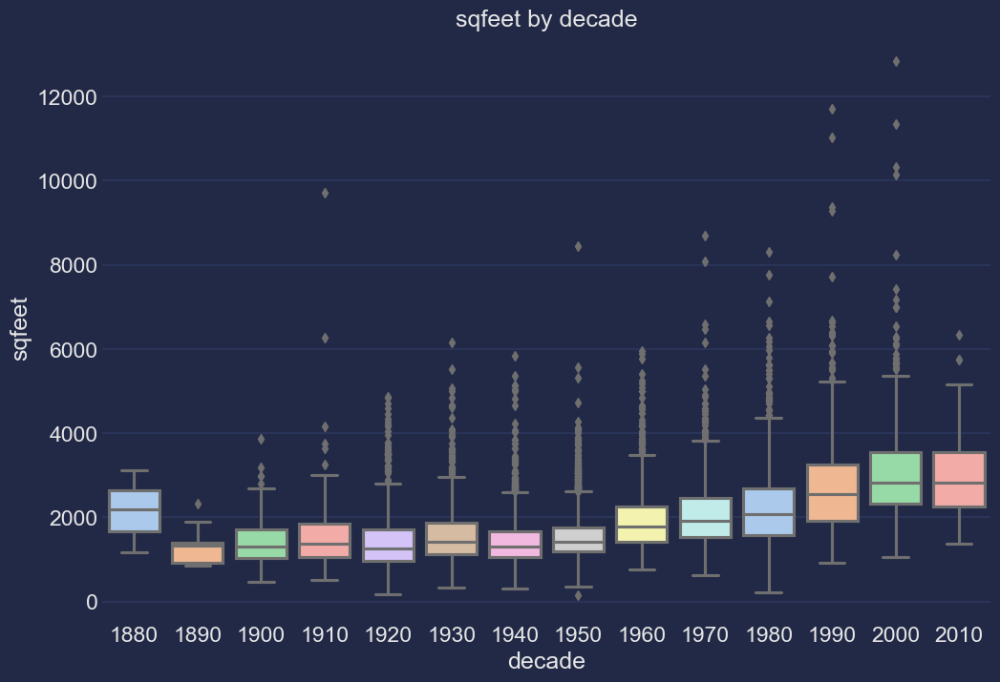

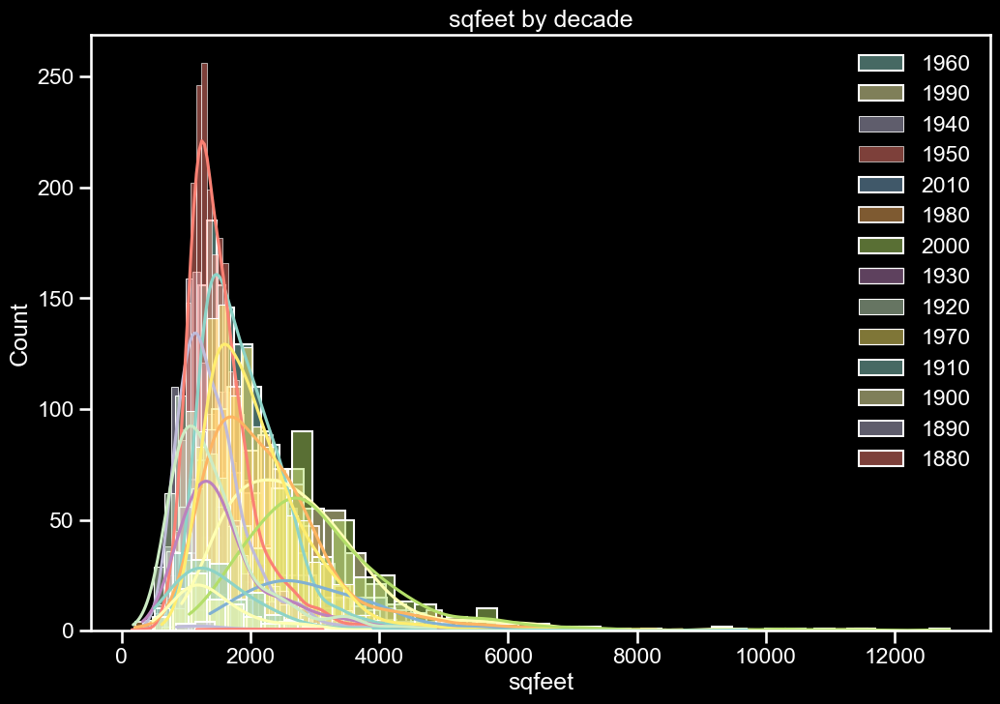

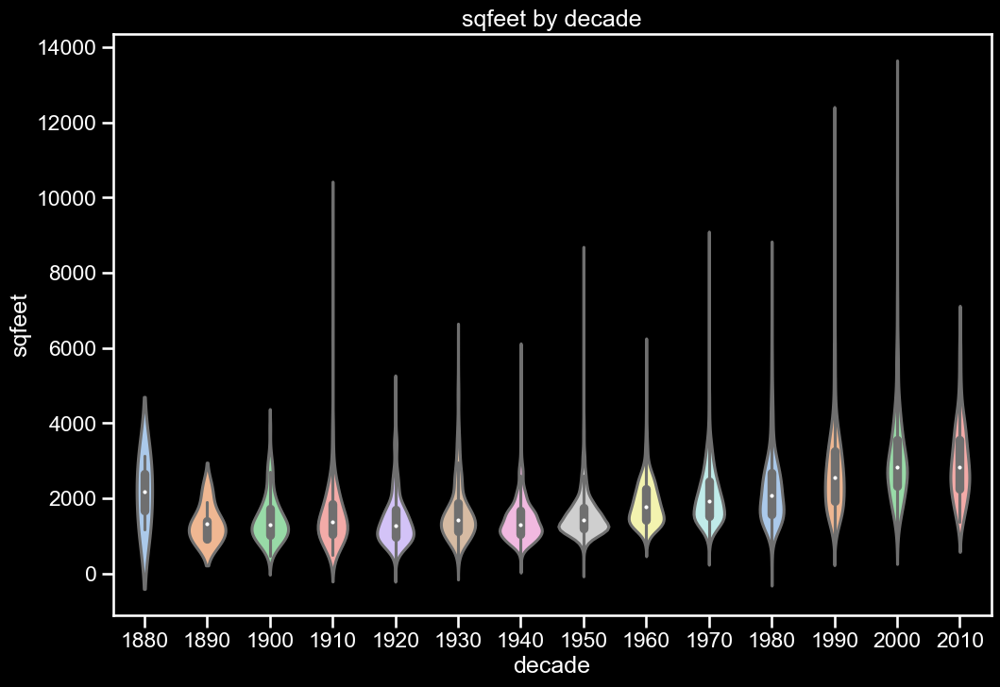

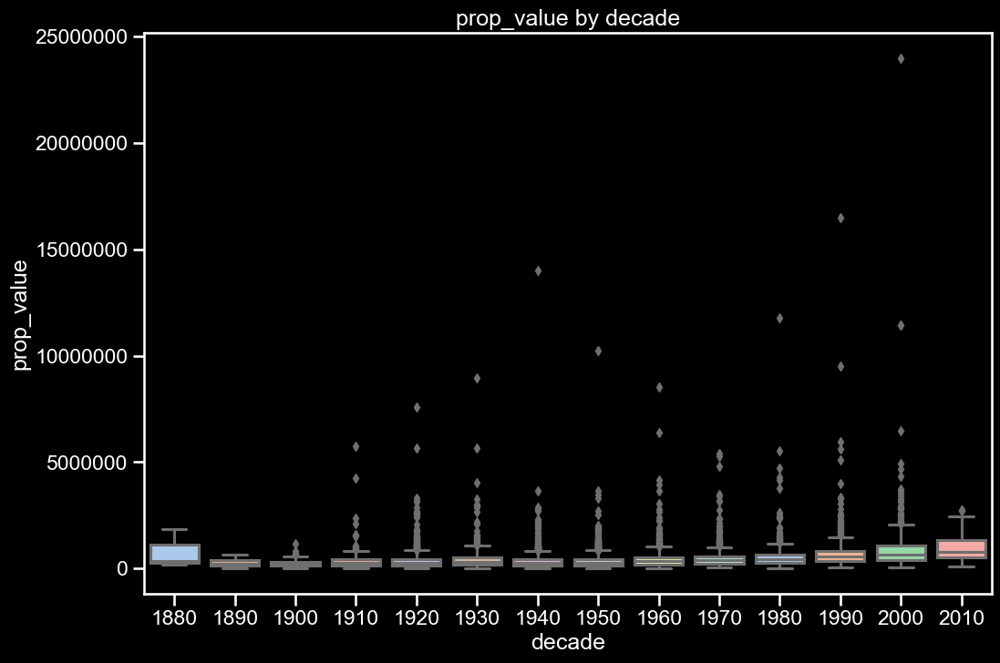

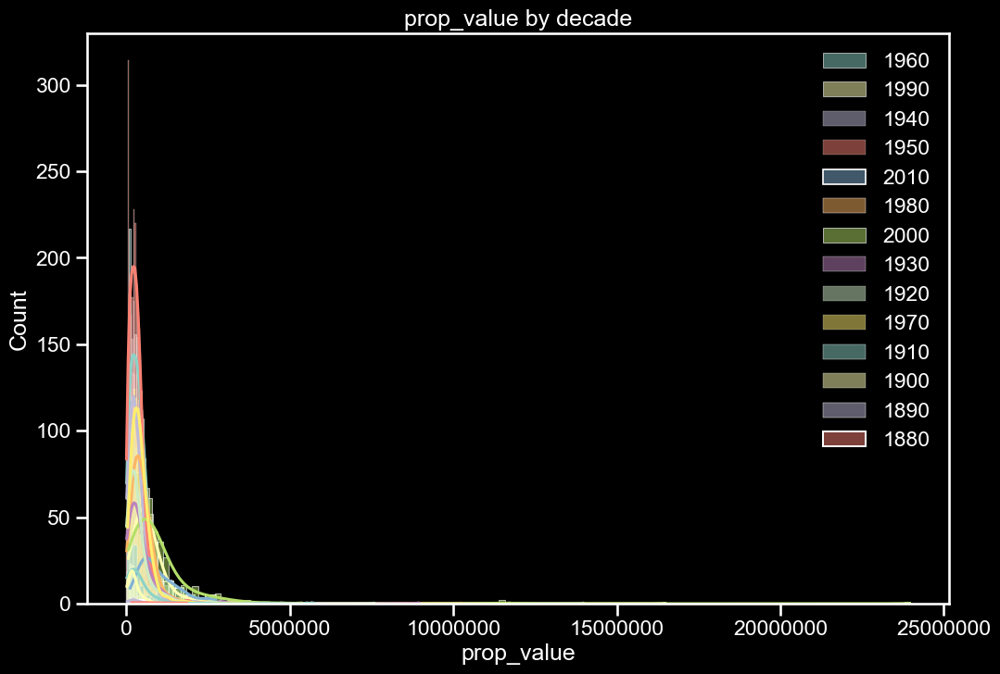

...

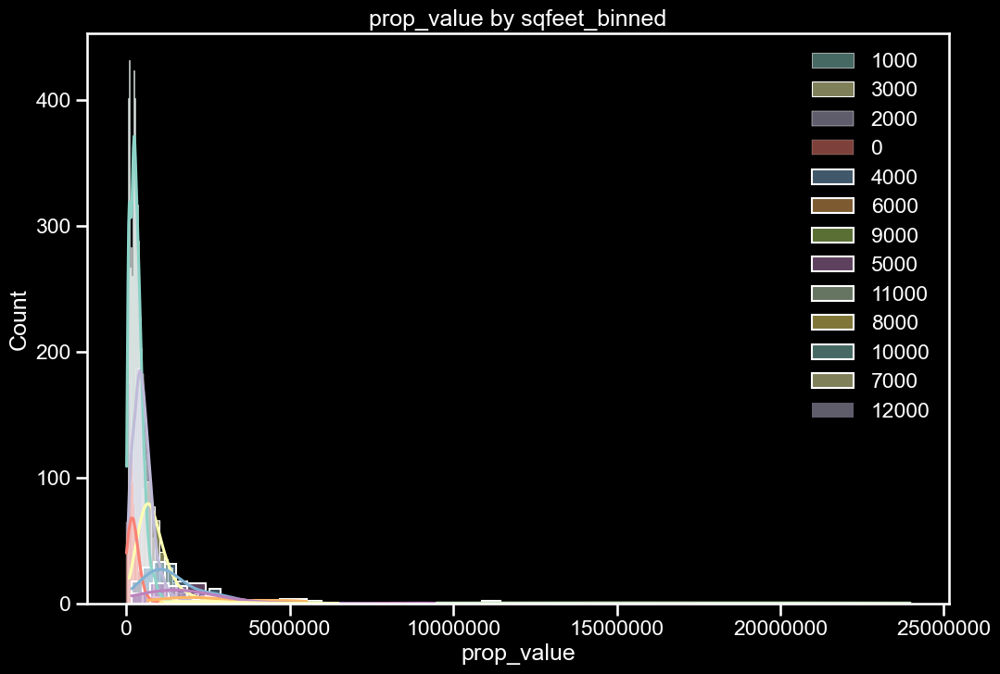

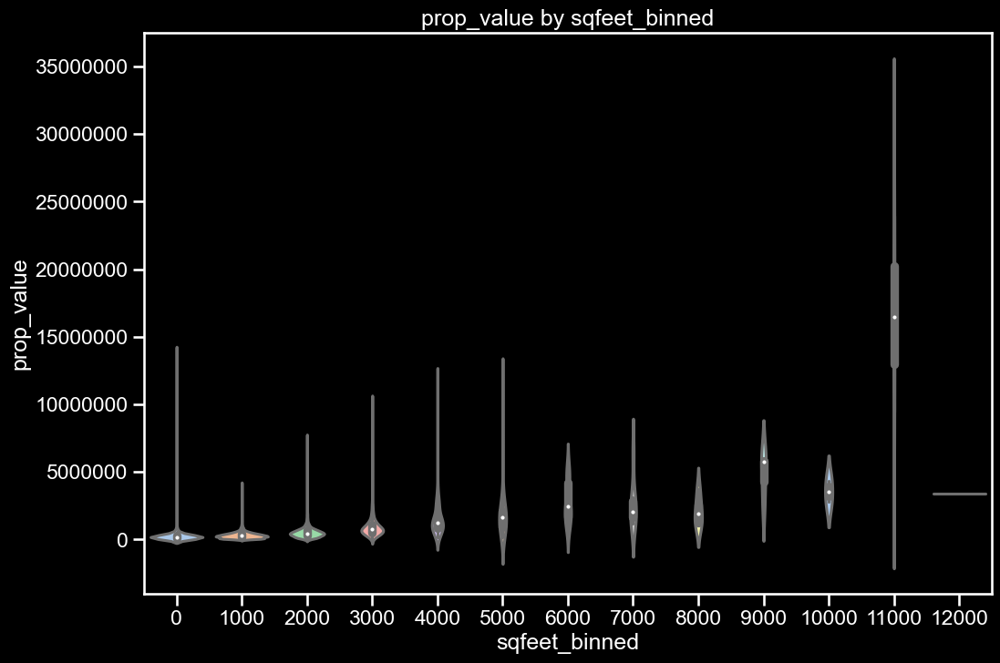

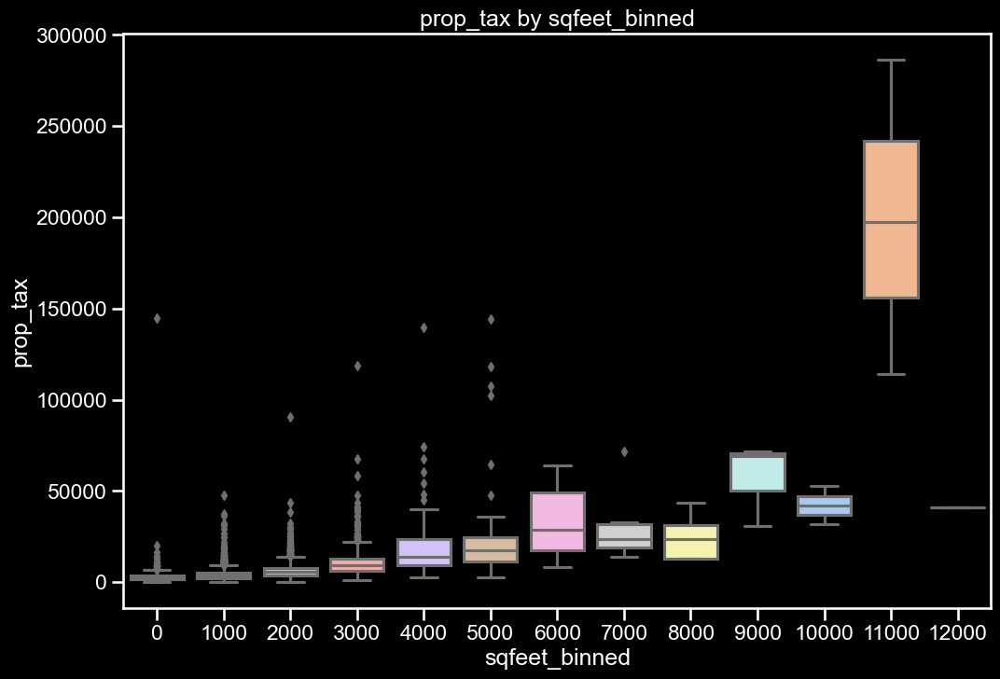

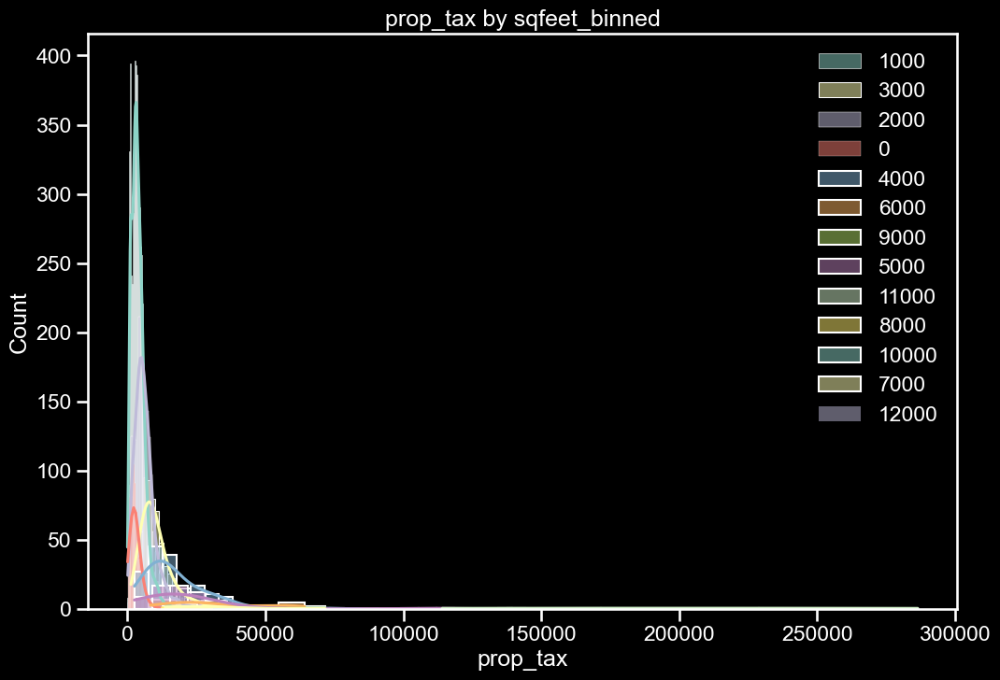

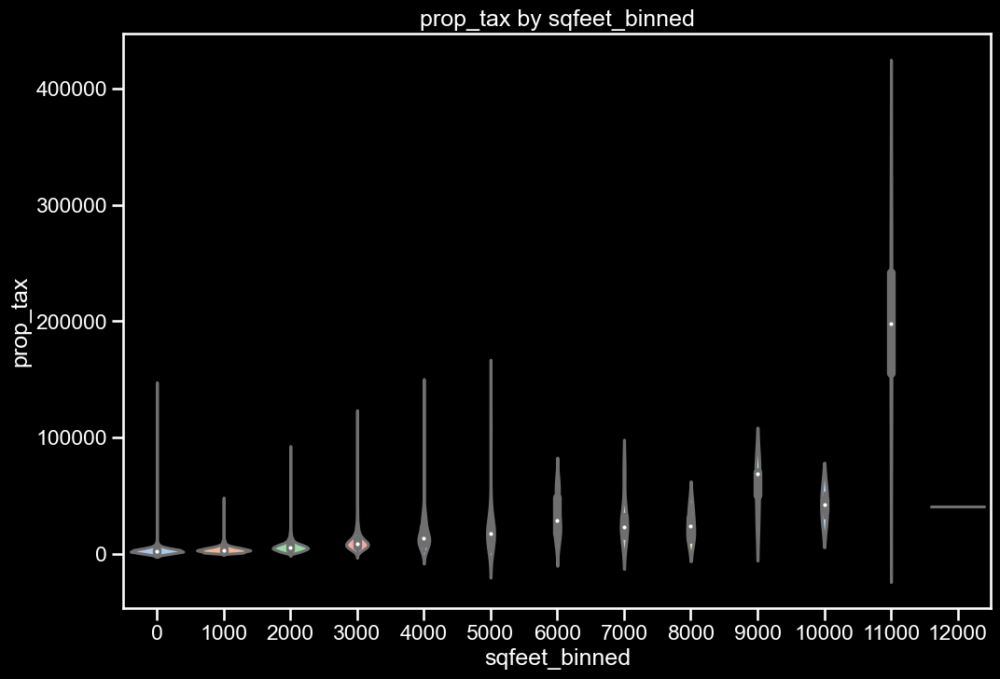

In [15]:
# Separate categories

cont = ["sqfeet", "prop_value", "prop_tax"]
cat = ["decade", "county", "baths", "beds", "sqfeet_binned"]

plot_categorical_and_continuous_vars(sm_df, cat, cont)

<div style="font-size: 30px; background-color: green;">
<u>Takeaways</u>

- This dataset has lots of outliers in most categories.
- Taking out the outliers in prop_value, should also handle most other outliers.
- Some of the correlations are obvious, like high bedrooms and high square feet or higher tax amount is higher tax value
</div>


### 5. 

Save the functions you have written to create visualizations in your explore.py file. Rewrite your notebook code so that you are using the functions imported from this file.

### 6. 

Use the functions you created above to explore your Zillow train dataset in your explore.ipynb notebook.

### 7. 

Come up with some initial hypotheses based on your goal of predicting property value.

- Newer homes in `decade` have higher `sqfeet`

- There is not significant difference in `prop_value` based on `decade`

- The median `prop_value` is not significantly different between `county`

- Having more `baths` increases the `prop_value`

- Having more `beds` does not significantly increase the `prop_value`

- Having more `sqfeet_binned` increases `prop_value`

### 8. 

Visualize all combinations of variables in some way.



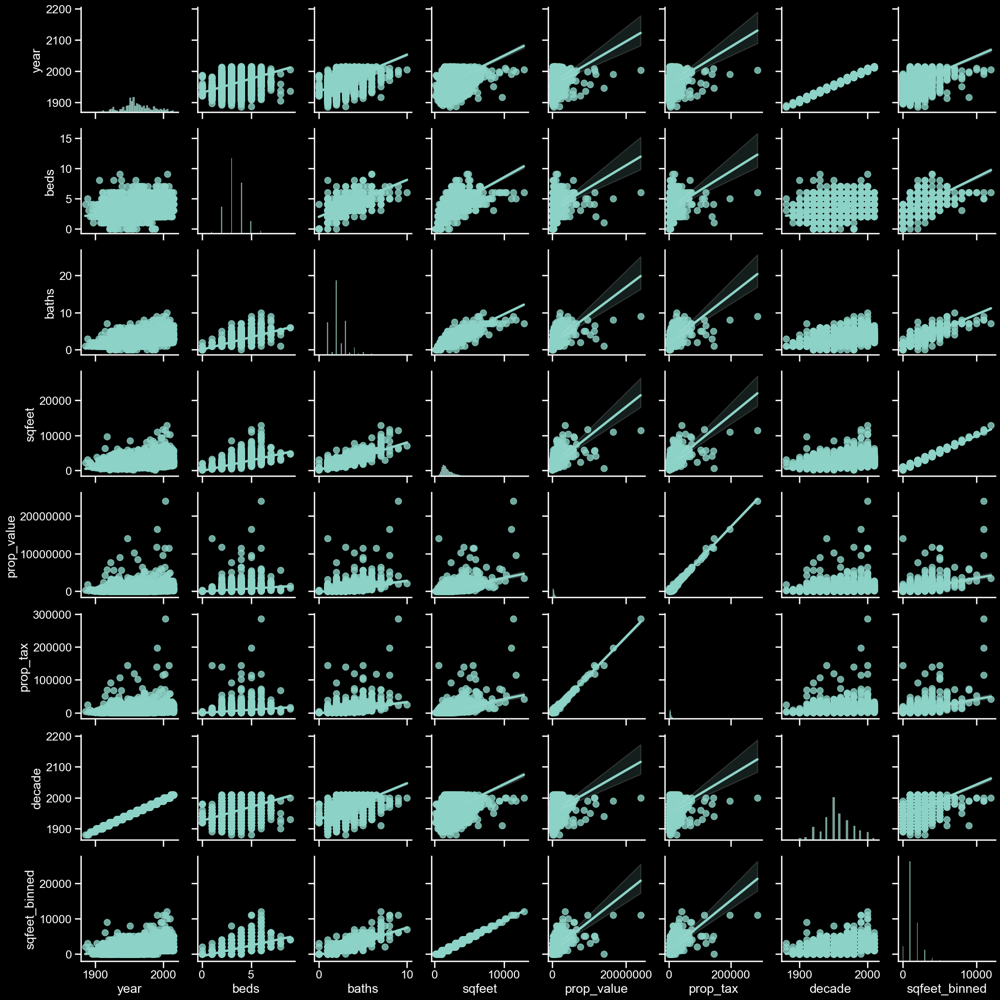

In [16]:
sns.pairplot(data=sm_df.sample(1000), kind="reg")
plt.show()

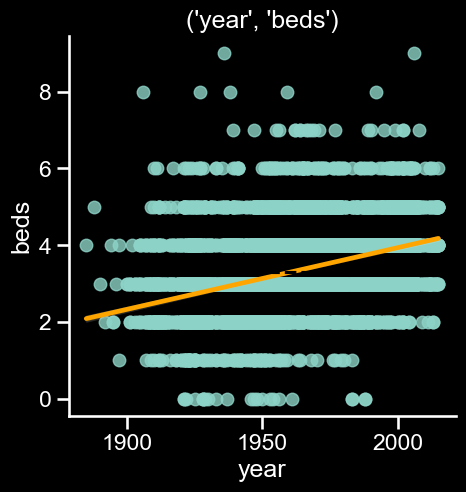

<Figure size 1200x800 with 0 Axes>

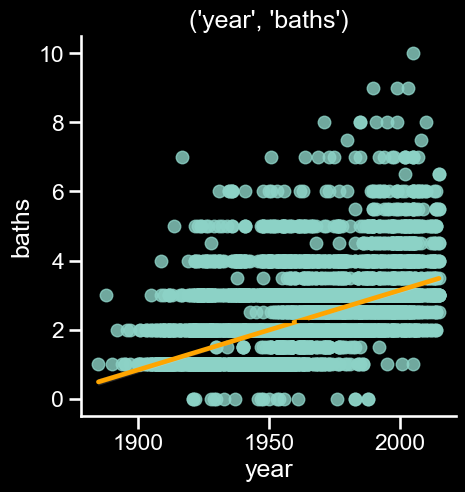

<Figure size 1200x800 with 0 Axes>

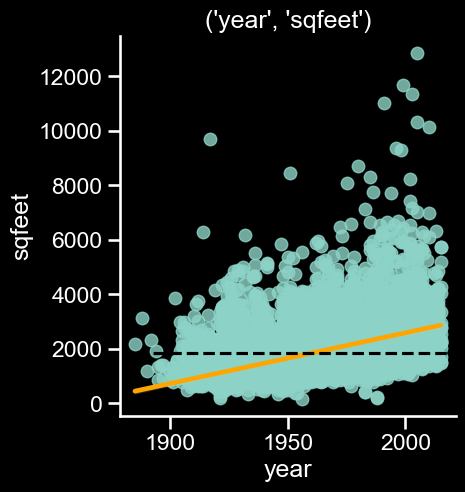

<Figure size 1200x800 with 0 Axes>

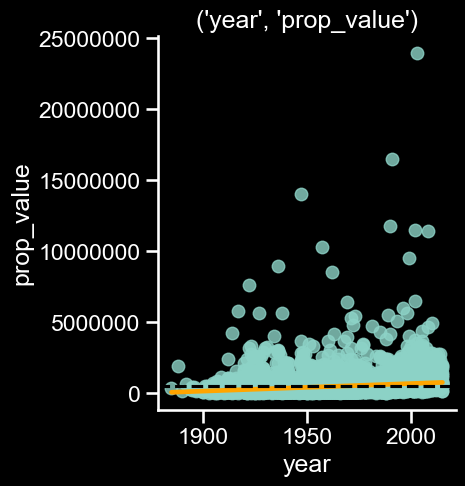

<Figure size 1200x800 with 0 Axes>

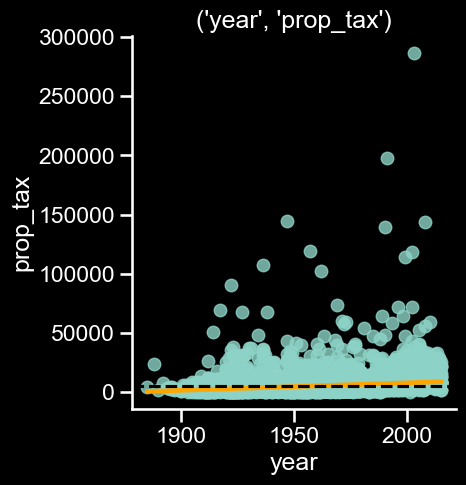

<Figure size 1200x800 with 0 Axes>

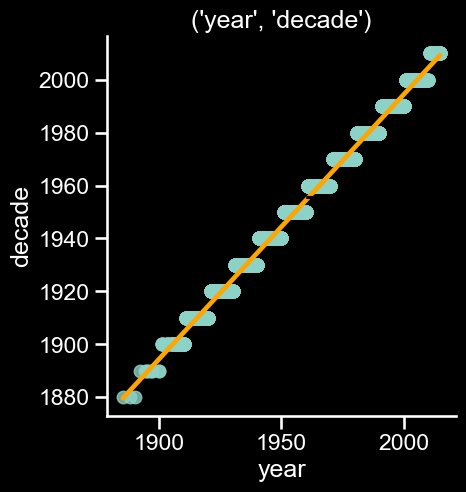

<Figure size 1200x800 with 0 Axes>

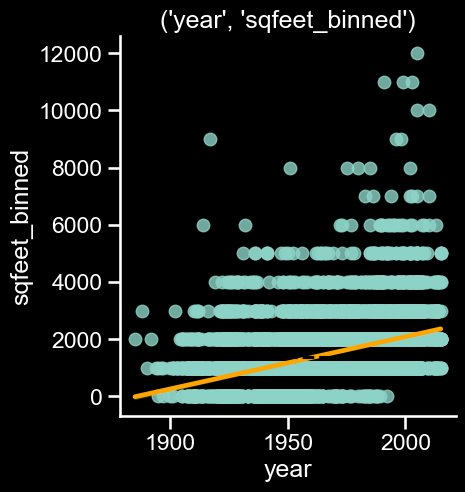

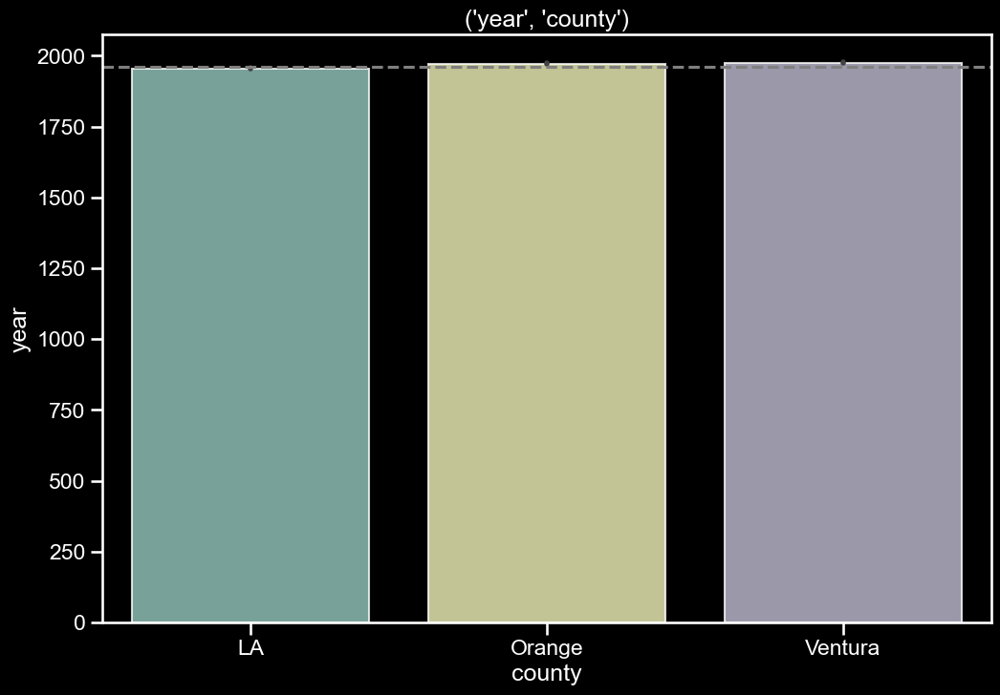

<Figure size 1200x800 with 0 Axes>

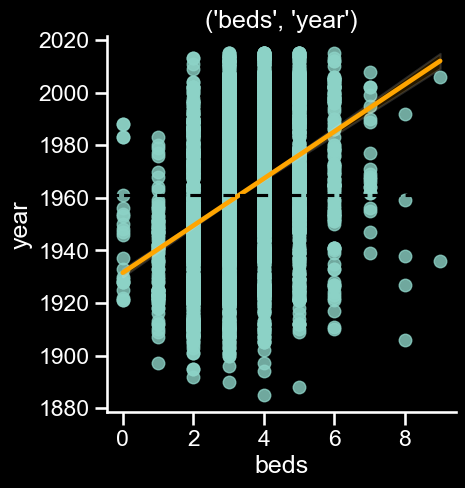

<Figure size 1200x800 with 0 Axes>

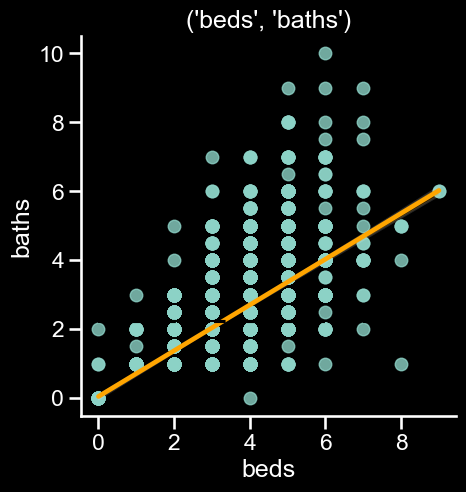

<Figure size 1200x800 with 0 Axes>

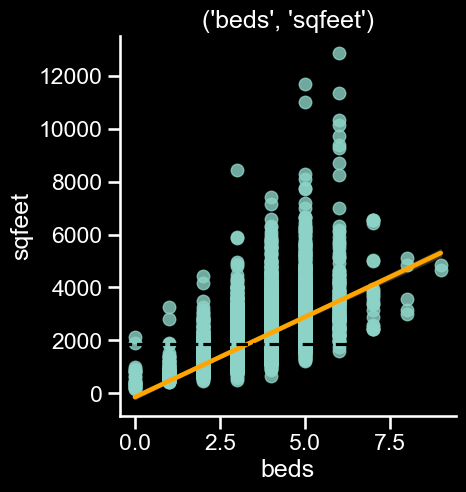

<Figure size 1200x800 with 0 Axes>

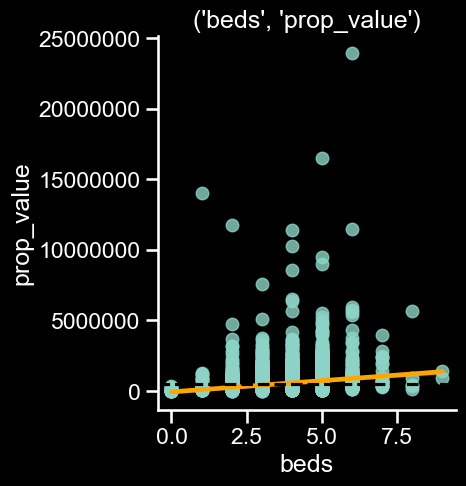

<Figure size 1200x800 with 0 Axes>

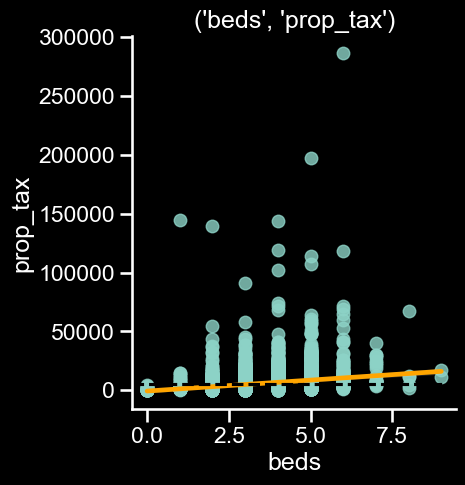

<Figure size 1200x800 with 0 Axes>

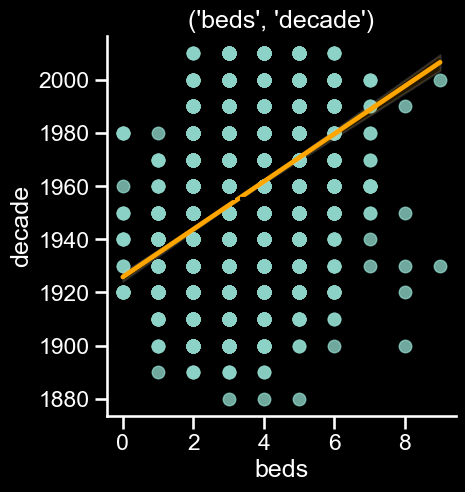

<Figure size 1200x800 with 0 Axes>

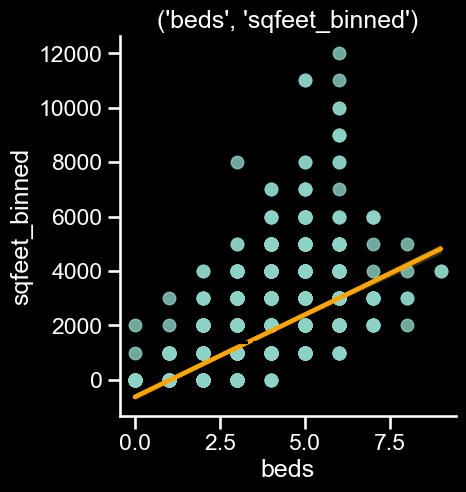

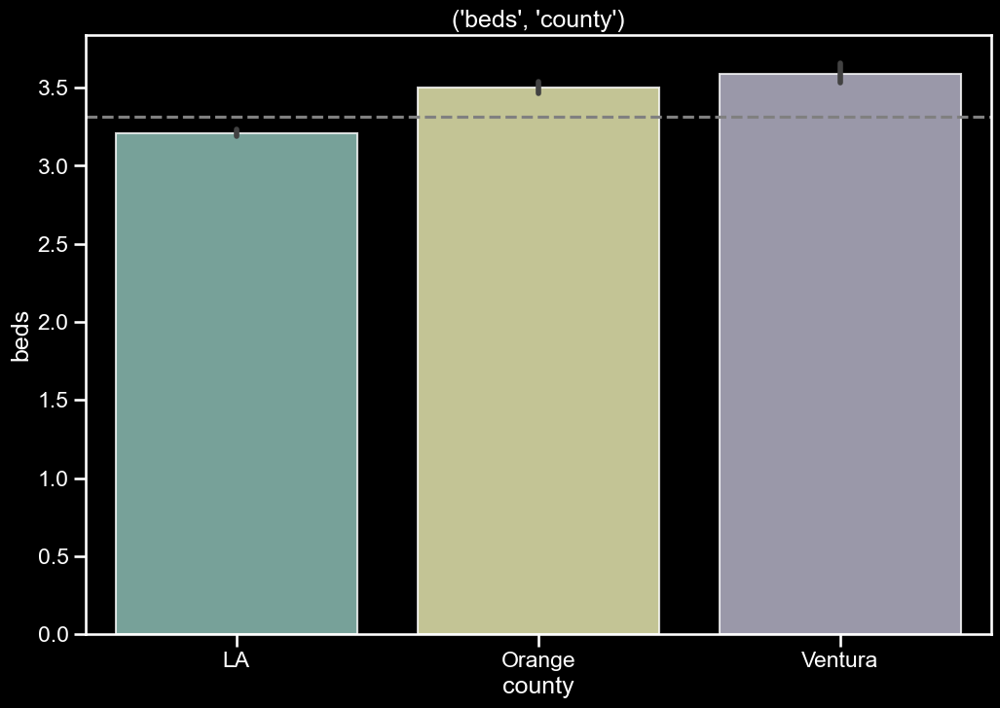

<Figure size 1200x800 with 0 Axes>

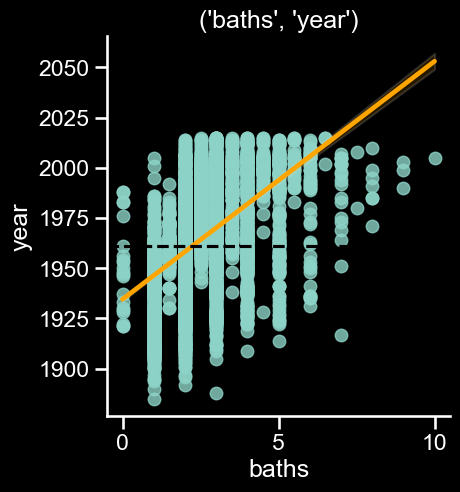

<Figure size 1200x800 with 0 Axes>

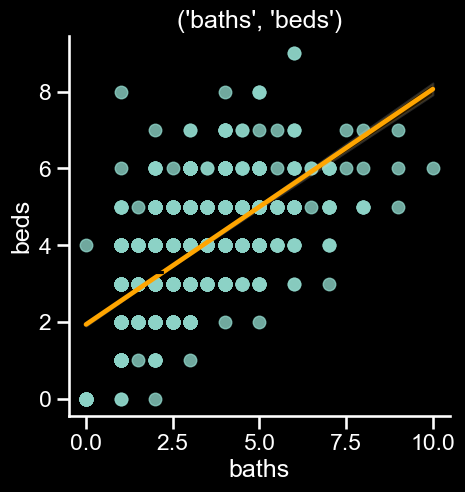

<Figure size 1200x800 with 0 Axes>

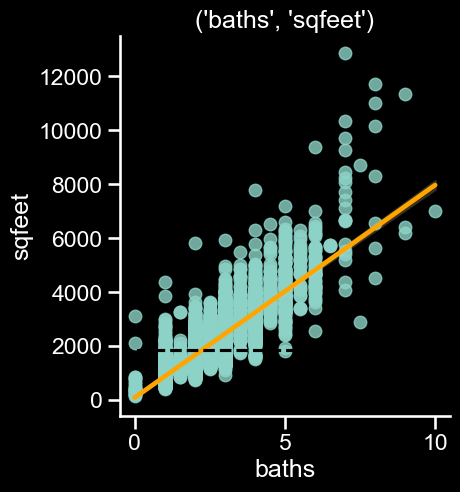

<Figure size 1200x800 with 0 Axes>

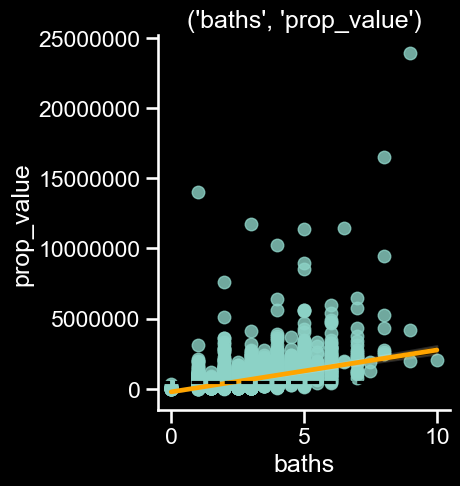

<Figure size 1200x800 with 0 Axes>

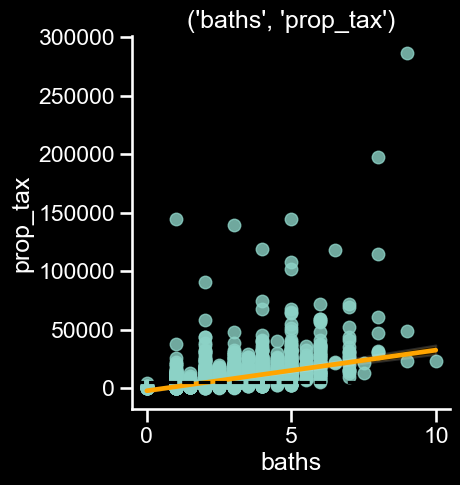

<Figure size 1200x800 with 0 Axes>

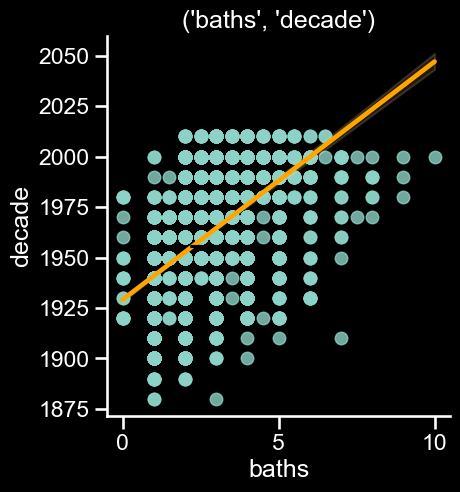

<Figure size 1200x800 with 0 Axes>

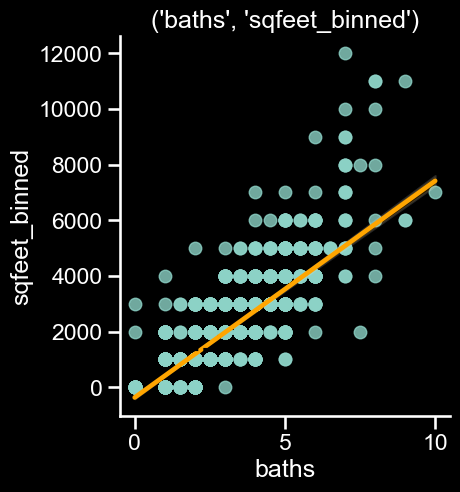

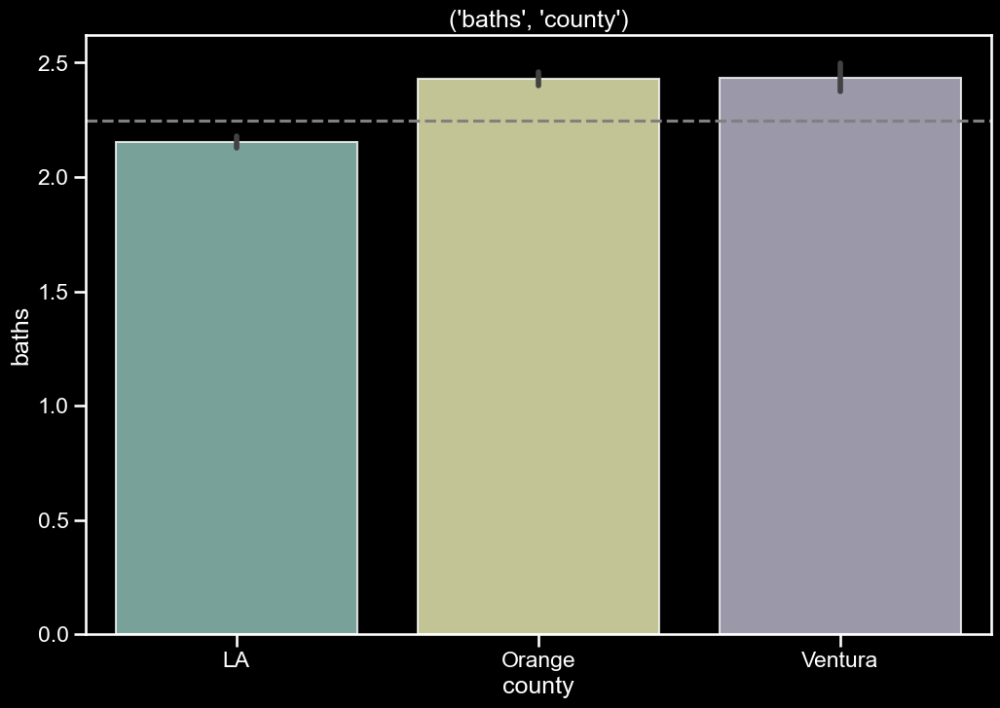

<Figure size 1200x800 with 0 Axes>

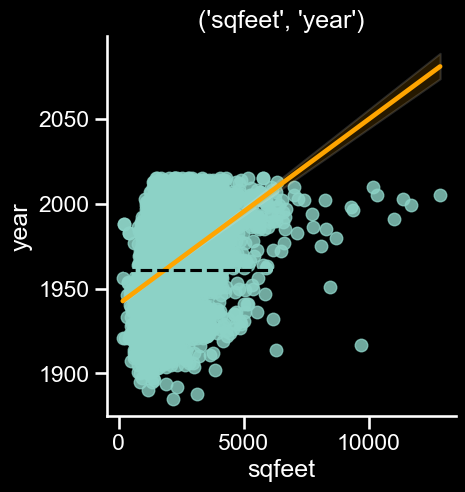

<Figure size 1200x800 with 0 Axes>

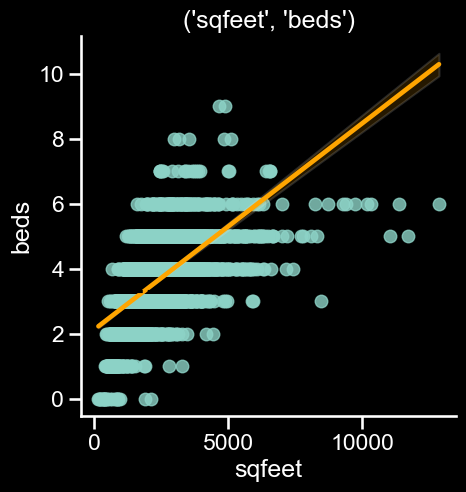

<Figure size 1200x800 with 0 Axes>

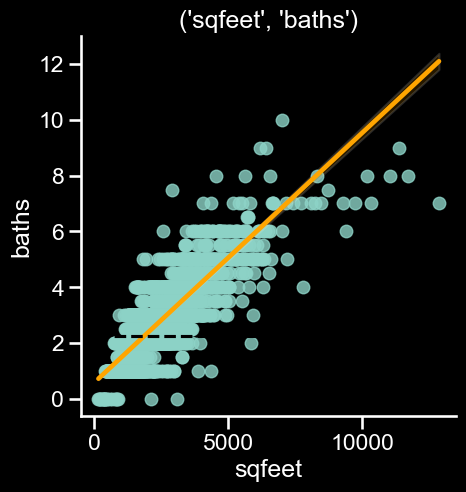

<Figure size 1200x800 with 0 Axes>

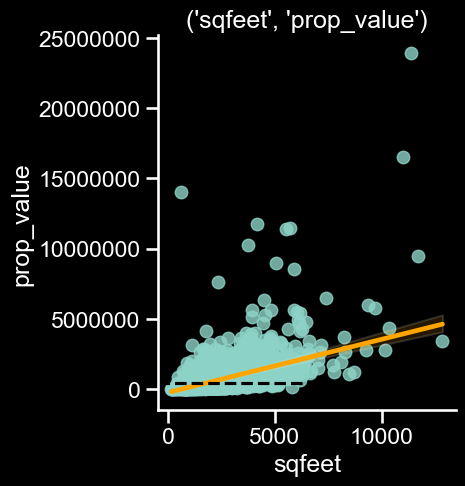

<Figure size 1200x800 with 0 Axes>

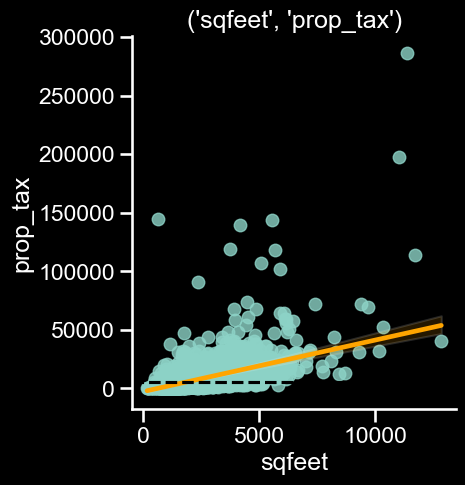

<Figure size 1200x800 with 0 Axes>

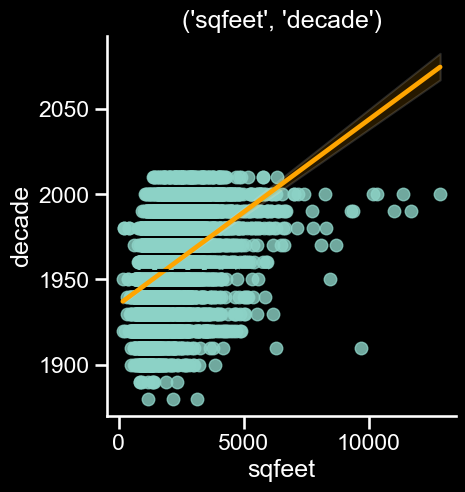

<Figure size 1200x800 with 0 Axes>

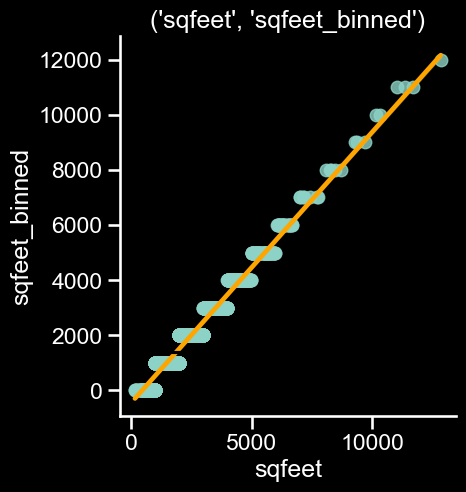

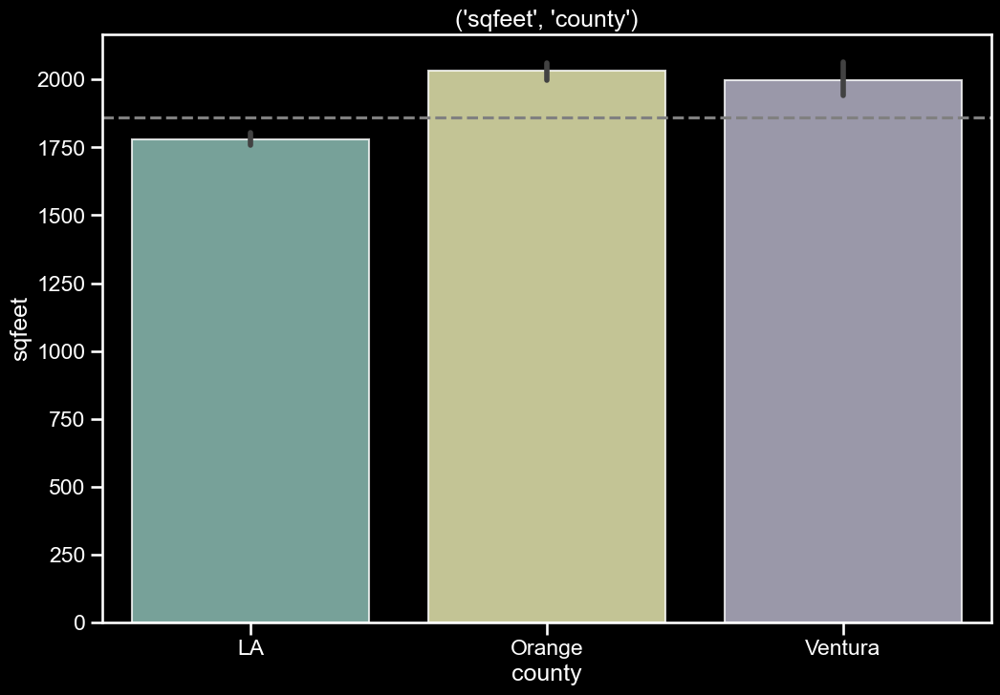

<Figure size 1200x800 with 0 Axes>

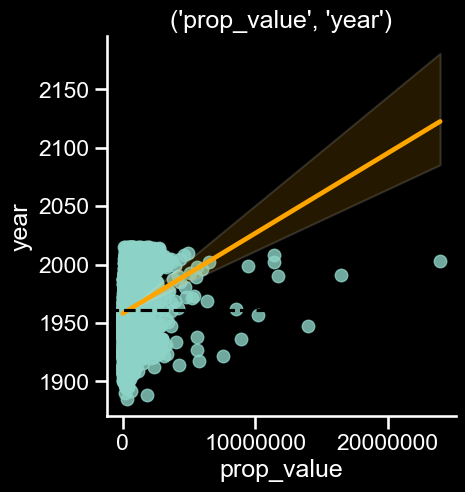

<Figure size 1200x800 with 0 Axes>

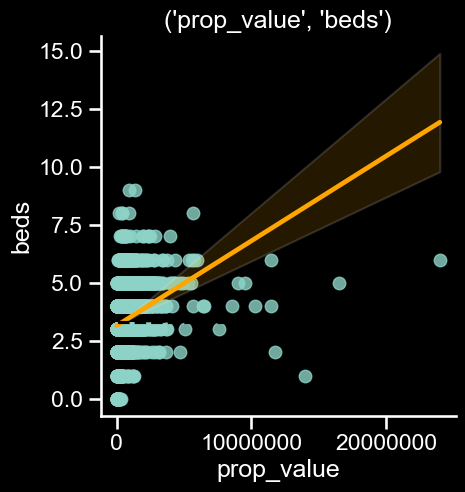

<Figure size 1200x800 with 0 Axes>

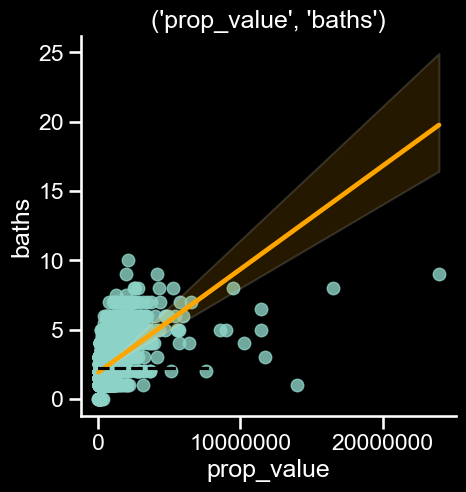

<Figure size 1200x800 with 0 Axes>

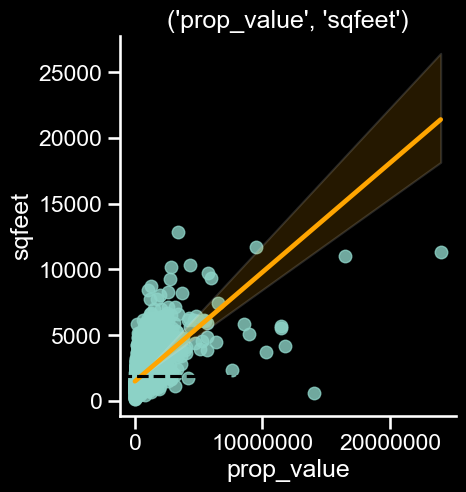

<Figure size 1200x800 with 0 Axes>

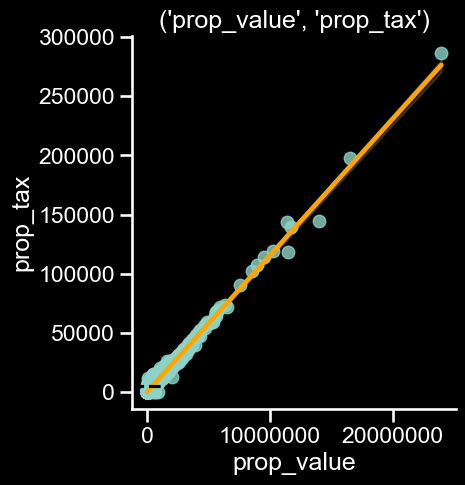

<Figure size 1200x800 with 0 Axes>

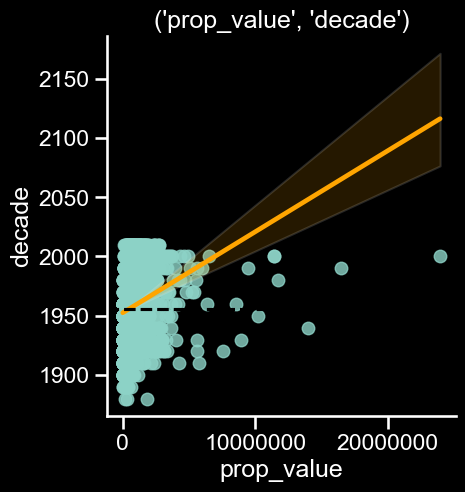

<Figure size 1200x800 with 0 Axes>

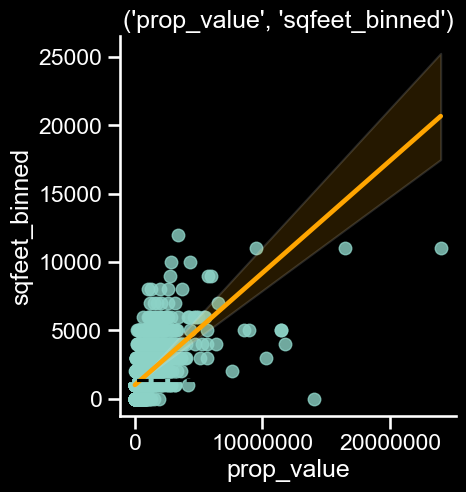

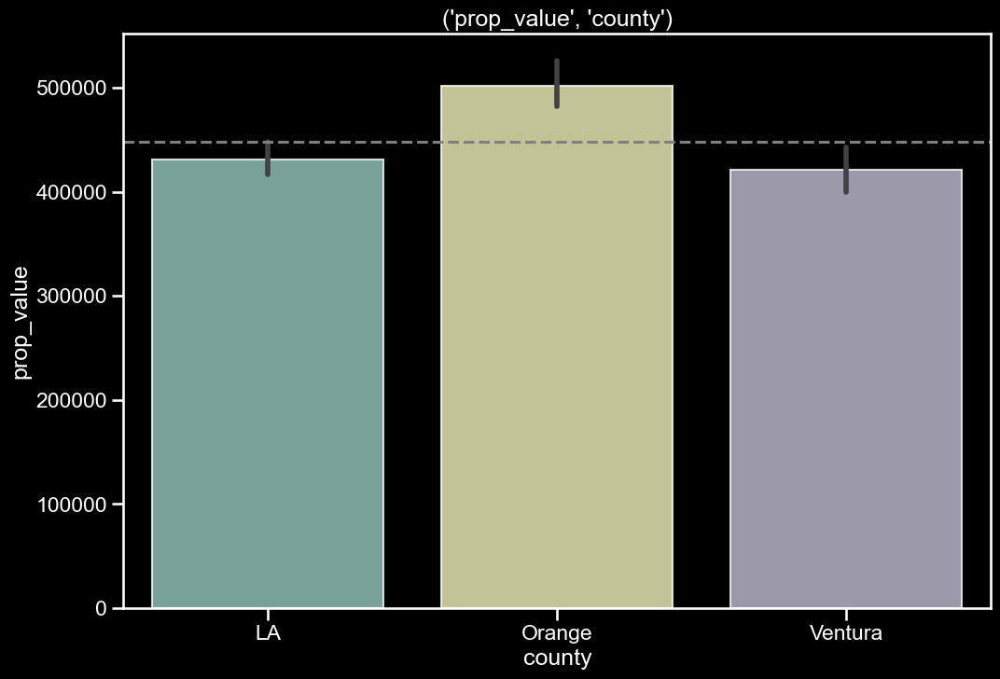

<Figure size 1200x800 with 0 Axes>

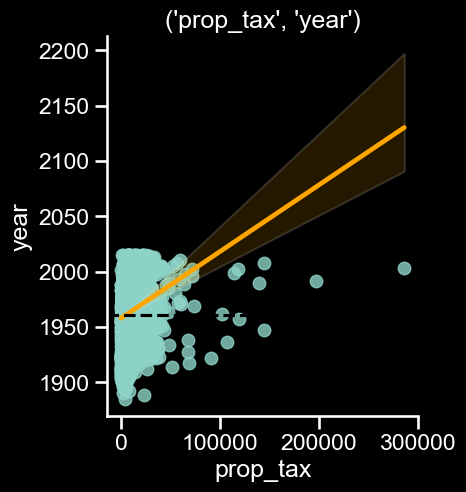

<Figure size 1200x800 with 0 Axes>

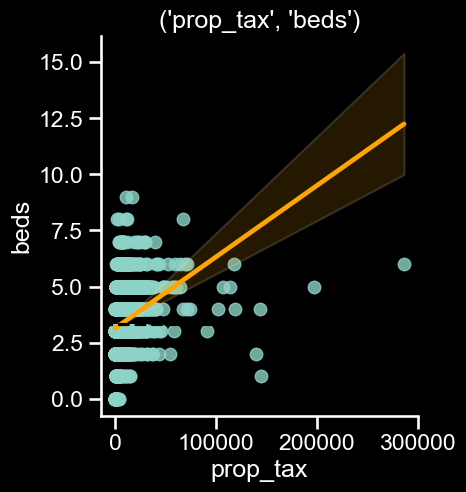

<Figure size 1200x800 with 0 Axes>

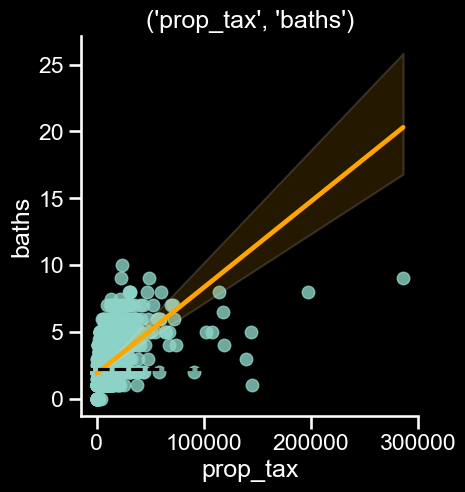

<Figure size 1200x800 with 0 Axes>

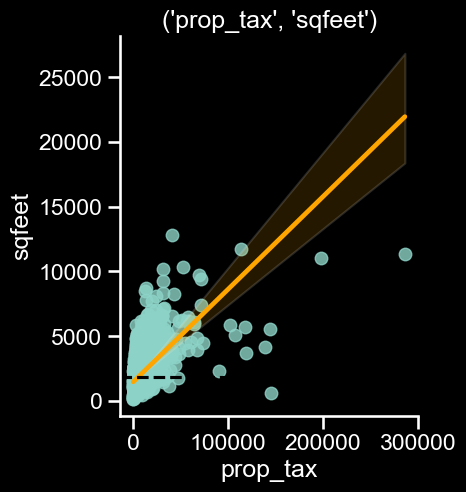

<Figure size 1200x800 with 0 Axes>

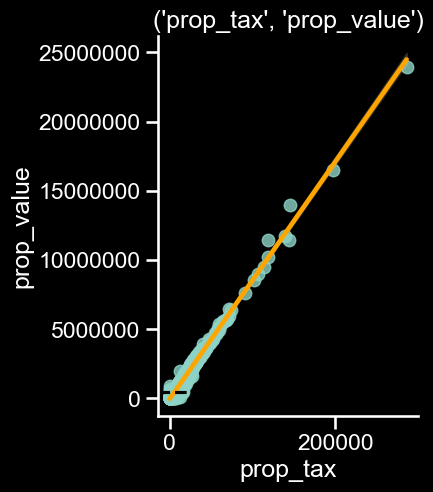

<Figure size 1200x800 with 0 Axes>

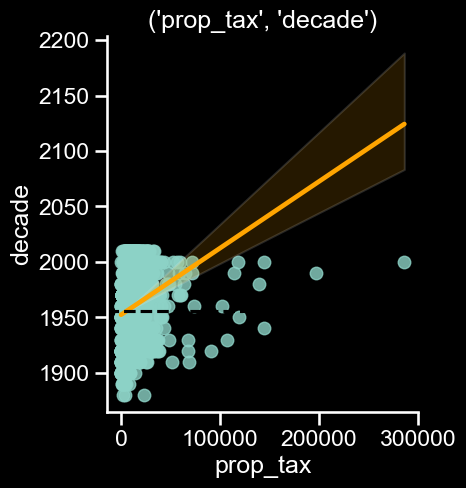

<Figure size 1200x800 with 0 Axes>

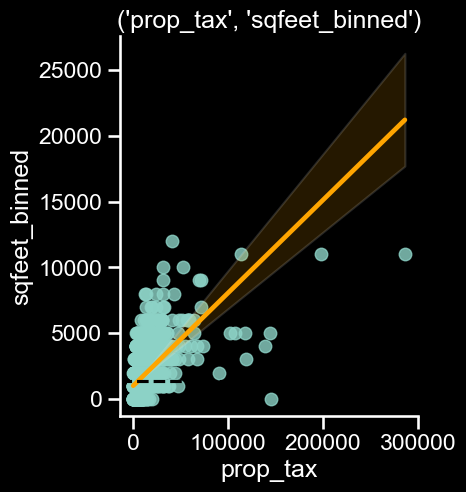

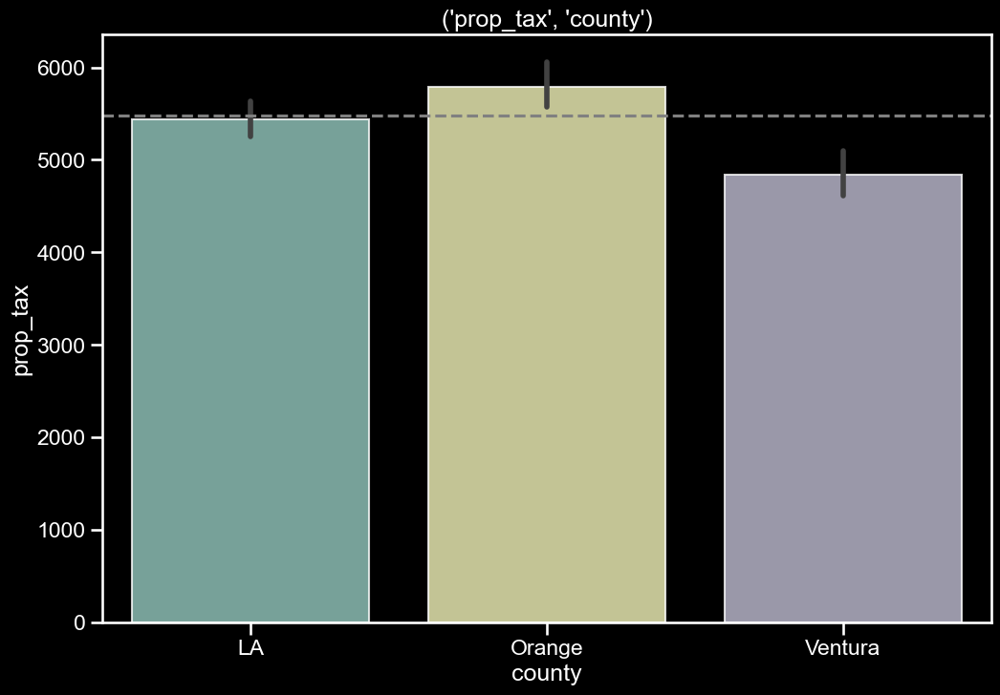

<Figure size 1200x800 with 0 Axes>

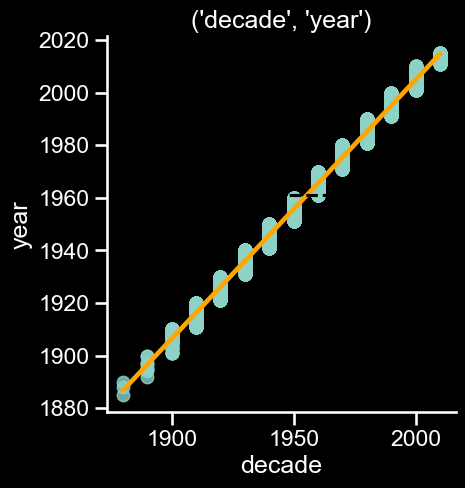

<Figure size 1200x800 with 0 Axes>

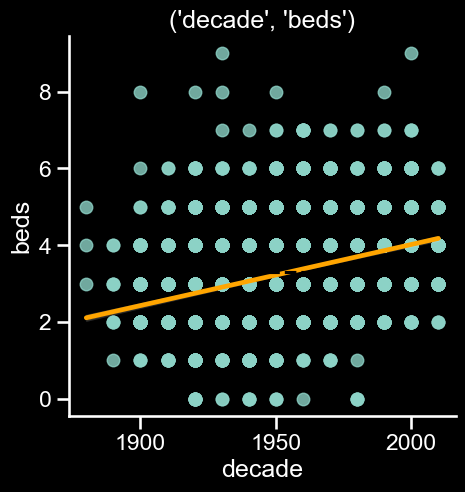

<Figure size 1200x800 with 0 Axes>

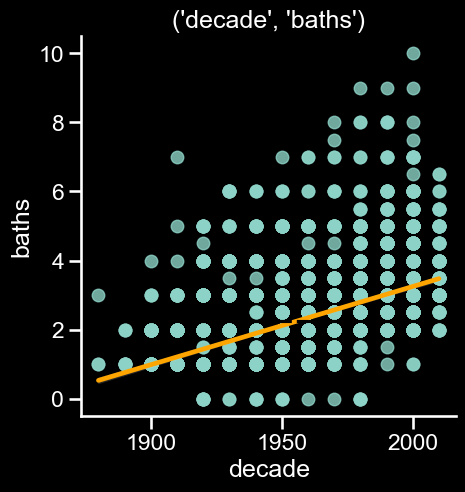

<Figure size 1200x800 with 0 Axes>

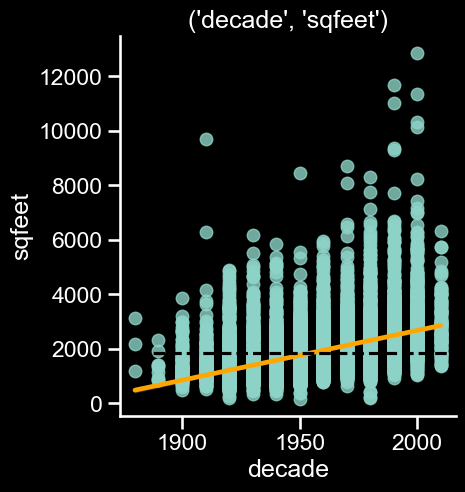

<Figure size 1200x800 with 0 Axes>

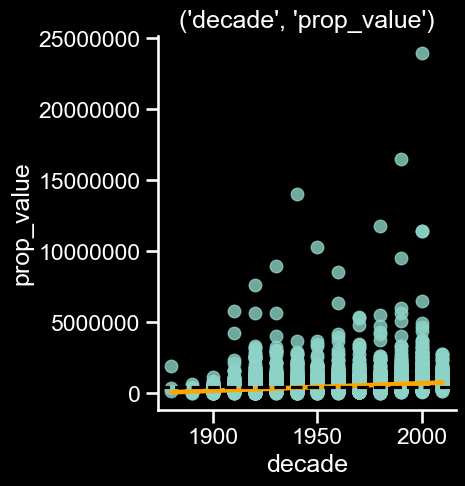

<Figure size 1200x800 with 0 Axes>

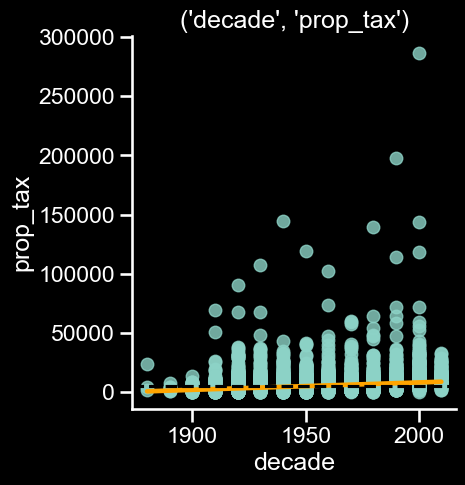

<Figure size 1200x800 with 0 Axes>

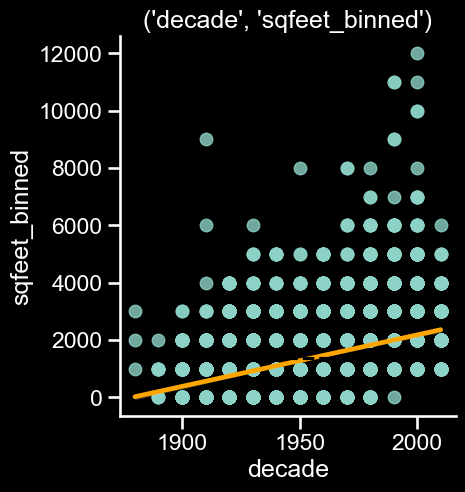

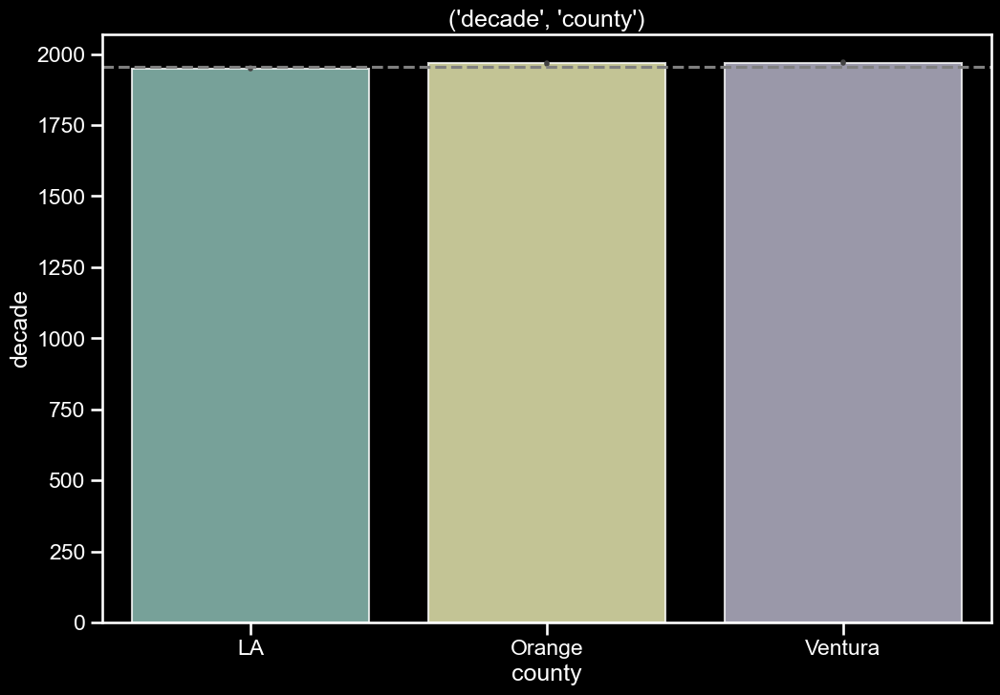

<Figure size 1200x800 with 0 Axes>

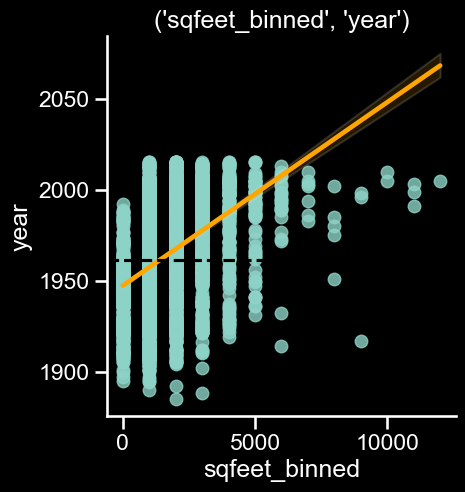

<Figure size 1200x800 with 0 Axes>

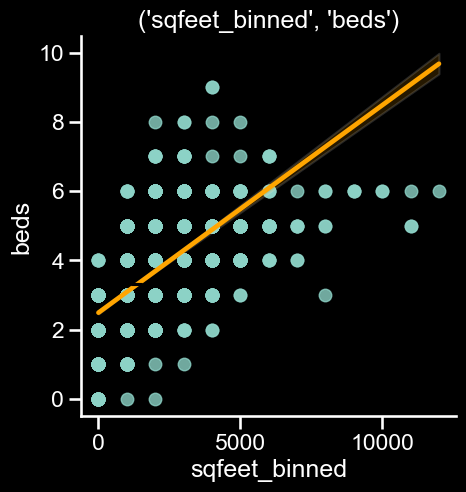

<Figure size 1200x800 with 0 Axes>

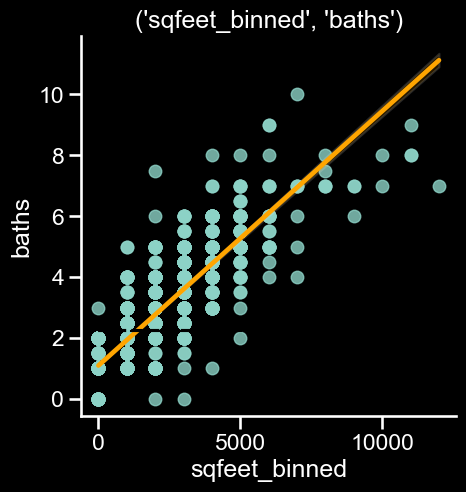

<Figure size 1200x800 with 0 Axes>

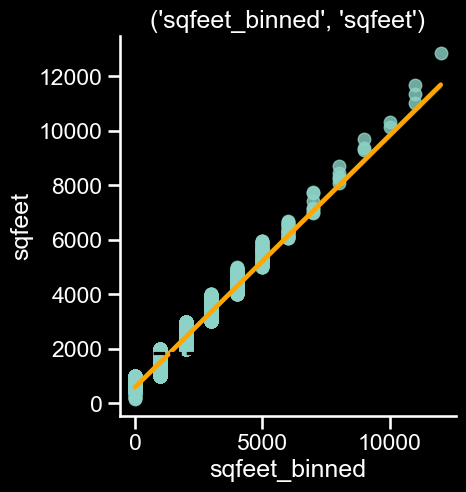

<Figure size 1200x800 with 0 Axes>

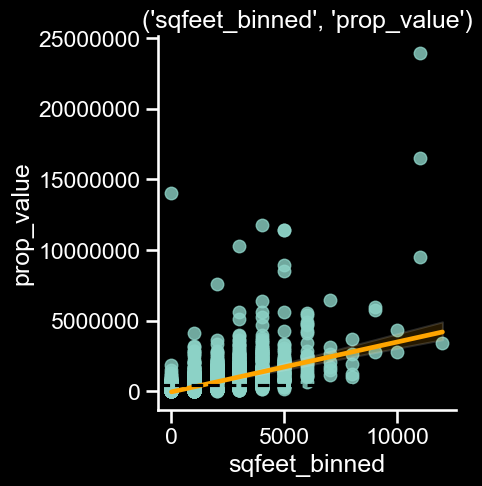

<Figure size 1200x800 with 0 Axes>

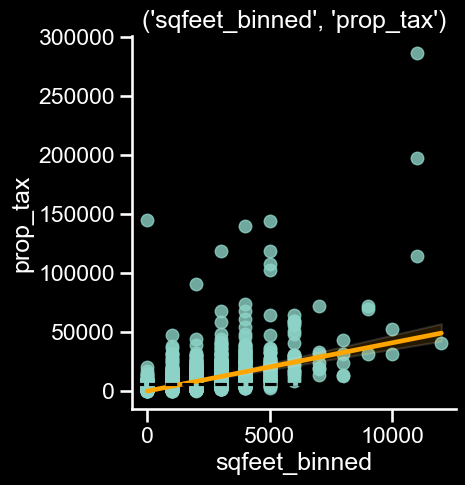

<Figure size 1200x800 with 0 Axes>

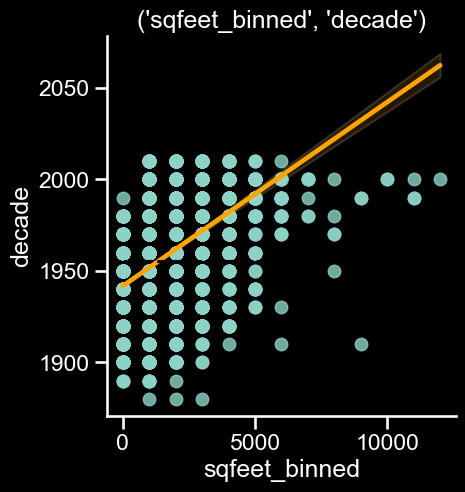

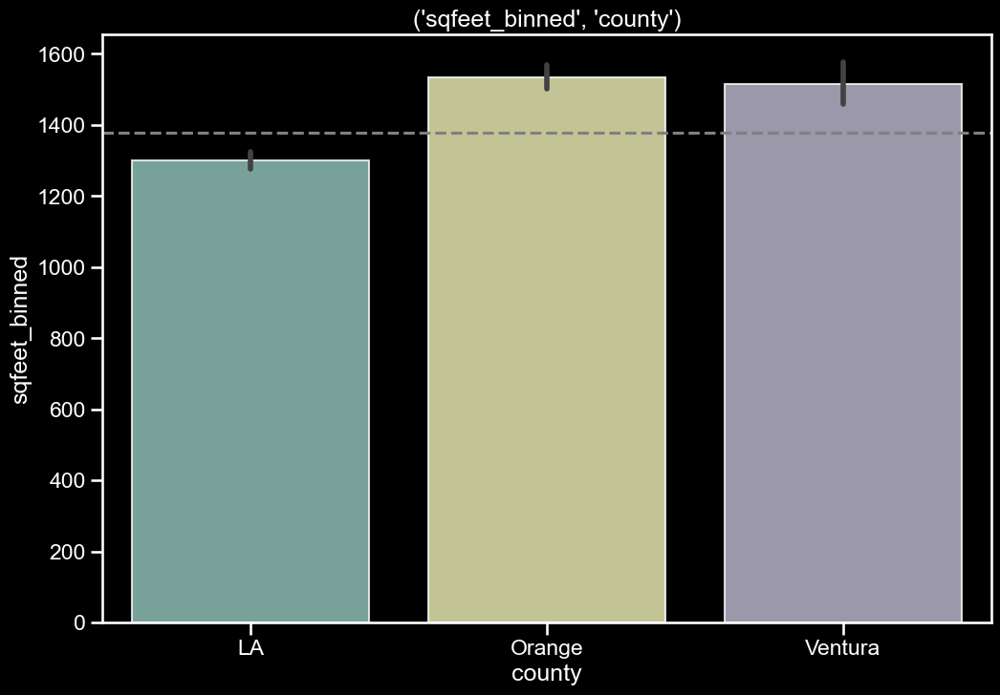

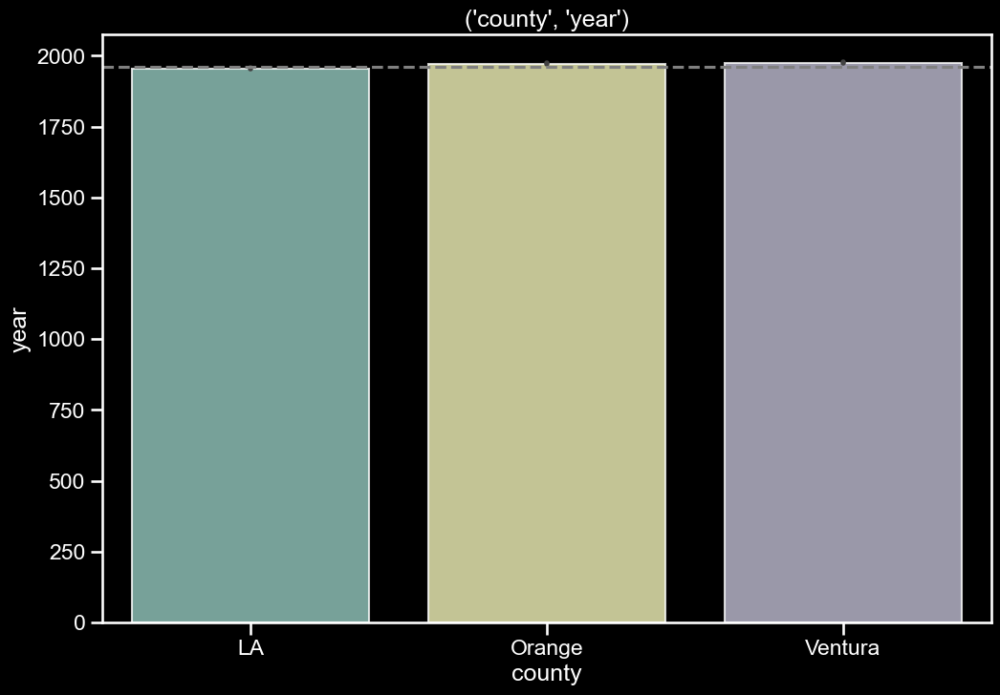

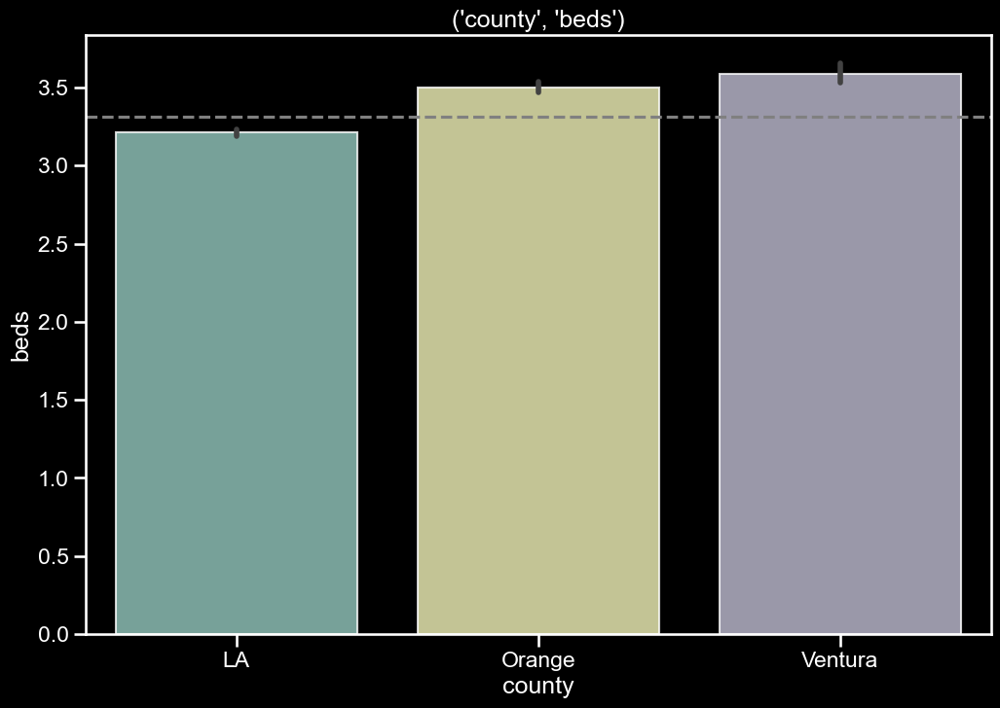

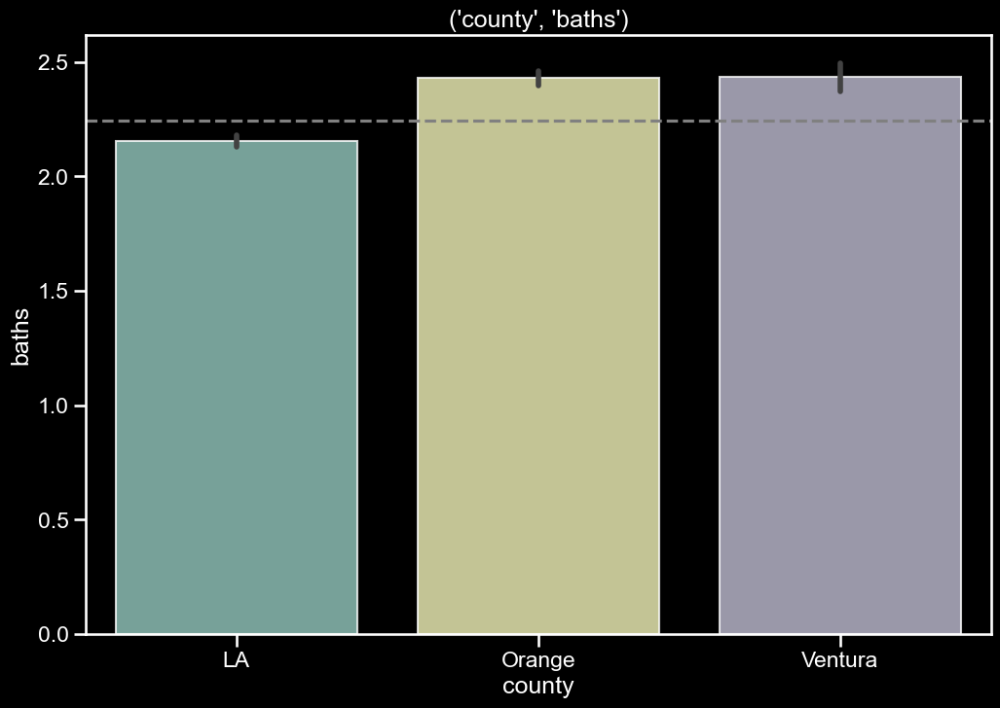

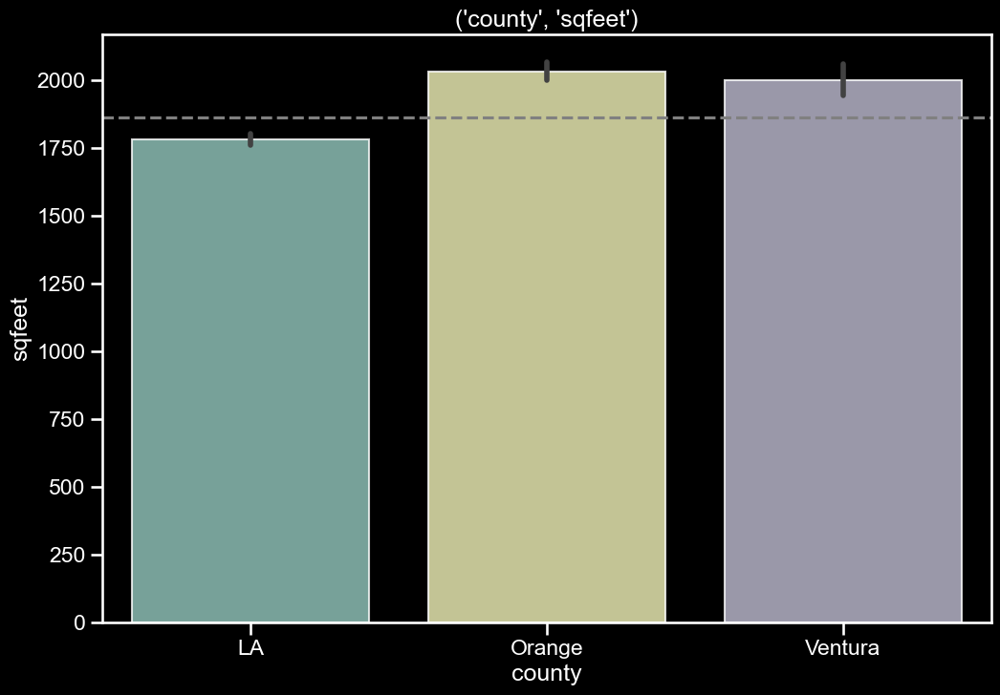

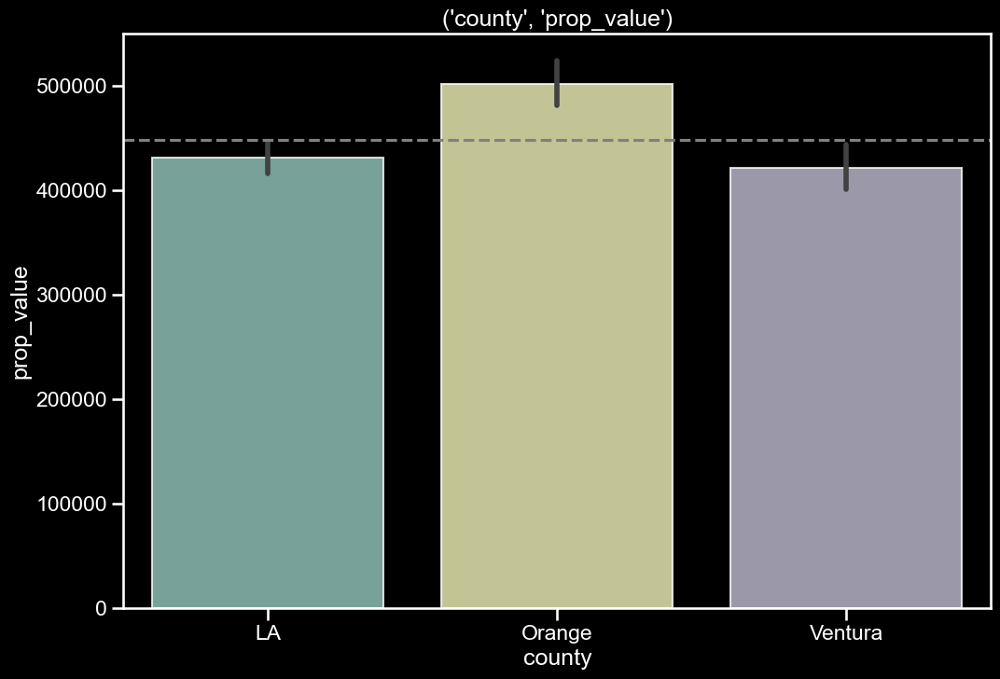

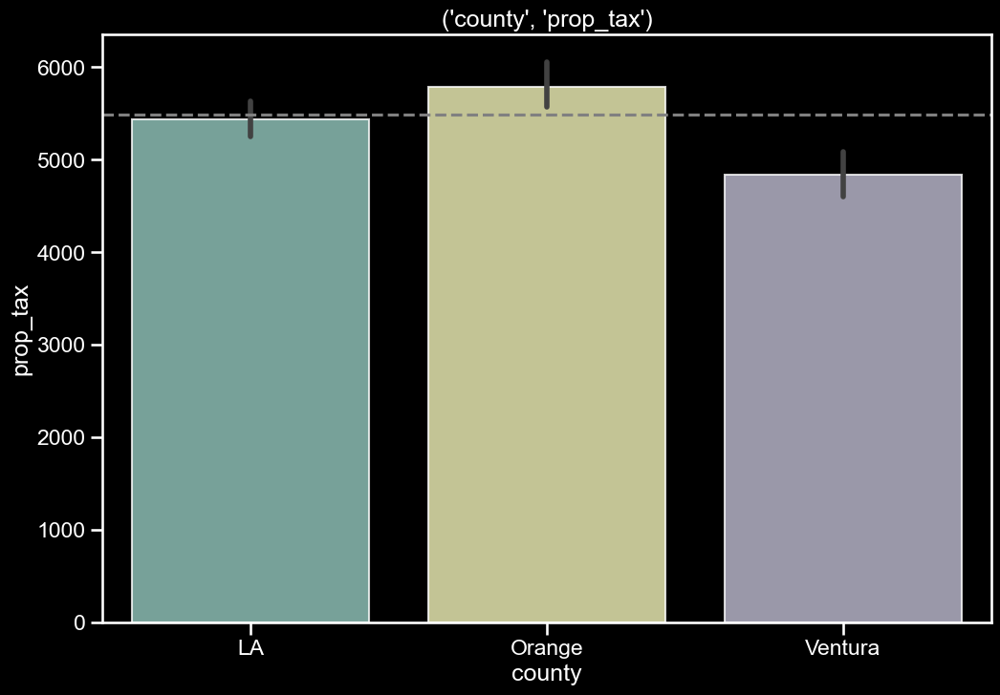

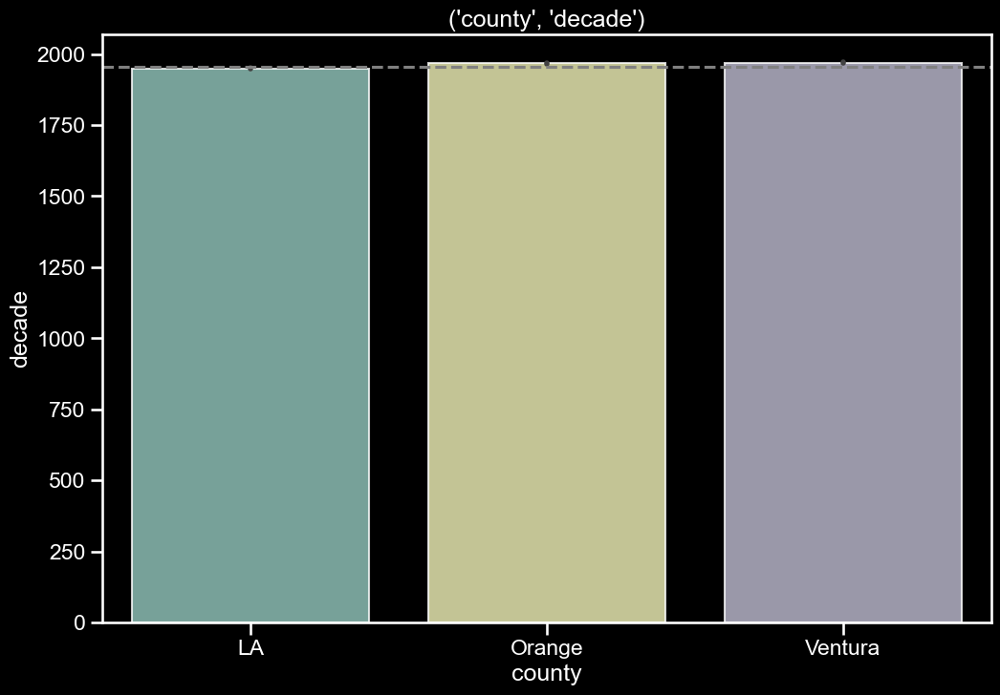

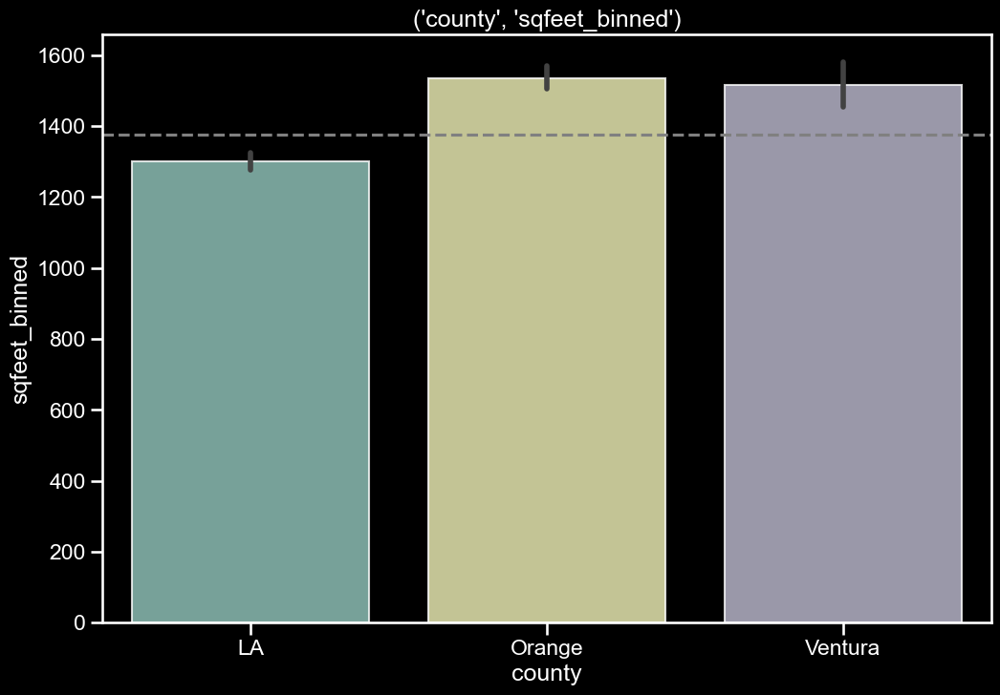

<Figure size 1200x800 with 0 Axes>

In [25]:
import itertools

cols = [
    "year",
    "beds",
    "baths",
    "sqfeet",
    "prop_value",
    "prop_tax",
    "decade",
    "sqfeet_binned",
    "county",
]


for col in itertools.permutations(cols, 2):
    # cat
    if col[1] == "county":
        sns.barplot(x=col[1], y=col[0], data=sm_df, alpha=0.8)
        overall_rate = sm_df[col[0]].mean()
        plt.axhline(overall_rate, ls="--", color="gray")
    elif col[0] == "county":
        sns.barplot(x=col[0], y=col[1], data=sm_df, alpha=0.8)
        overall_rate = sm_df[col[1]].mean()
        plt.axhline(overall_rate, ls="--", color="gray")
    else:
        average = sm_df[col[1]].mean()
        sns.lmplot(x=col[0], y=col[1], data=sm_df, line_kws={"color": "orange"})
        plt.axhline(average, ls="--", color="black")
    plt.title(col)
    plt.show()
    plt.figure(figsize=(12, 8))

<div style="font-size: 30px; background-color: green;">
<u>Takeaways</u>

- sq feet seems to be highly related to value
- bathrooms seems to be loosely related, but most likely due to increased square feet
- bathrooms have increased over the years
- bedrooms in the late 1800s had more average bedrooms than now
</div>

### 9. 

Run the appropriate statistical tests where needed.



In [14]:
check_columns(sm_df)

,Column Name,Number of Unique Values,Unique Values,Number of Null Values,Proportion of Null Values,dtype
0,year,124,"[1963, 1998, 1992, 1950, 1958, 1962, 1955, 201...",0,0.0,int64
1,beds,10,"[3, 2, 4, 6, 5, 1, 7, 8, 9, 0]",0,0.0,int64
2,baths,18,"[2.0, 2.5, 3.5, 3.0, 1.0, 4.0, 6.0, 4.5, 5.0, ...",0,0.0,float64
3,sqfeet,2888,"[1410, 1927, 3293, 1568, 1255, 1511, 1300, 270...",0,0.0,int64
4,prop_value,9307,"[186697, 587421, 796473, 848481, 251385, 85611...",0,0.0,int64
5,prop_tax,6425,"[2762, 7195, 9392, 10316, 3129, 1273, 4528, 13...",0,0.0,int64
6,county,3,"[LA, Orange, Ventura]",0,0.0,object


In [19]:
import pandas as pd
from scipy.stats import chi2_contingency, mannwhitneyu


def compare_columns(df):
    """
    Performs chi-squared and Mann-Whitney U tests on all columns of a dataframe against each other.
    Returns a dataframe containing the p-values of the tests.
    """
    chi2_p_values = {}
    whitney_p_values = {}
    columns = df.columns
    for i, col1 in enumerate(columns):
        for j, col2 in enumerate(columns):
            if i < j:
                try:
                    contingency_table = pd.crosstab(df[col1], df[col2])
                    _, chi2_p_value, _, _ = chi2_contingency(contingency_table)
                    chi2_p_values[(col1, col2)] = chi2_p_value
                except:
                    pass
                try:
                    _, whitney_p_value = mannwhitneyu(df[col1], df[col2])
                    whitney_p_values[(col1, col2)] = whitney_p_value
                except:
                    pass
    chi2_df = pd.DataFrame.from_dict(
        chi2_p_values, orient="index", columns=["chi2_p_value"]
    )
    whitney_df = pd.DataFrame.from_dict(
        whitney_p_values, orient="index", columns=["whitney_p_value"]
    )
    return pd.concat([chi2_df, whitney_df], axis=1)


compare_columns(sm_df)

chi2_p_value  whitney_p_value
year       beds         0.000000e+00              0.0
           baths        0.000000e+00              0.0
           sqfeet       0.000000e+00              0.0
           prop_value   1.014812e-24              0.0
           prop_tax    6.625083e-241              0.0
           county       0.000000e+00              NaN
beds       baths        0.000000e+00              0.0
           sqfeet       0.000000e+00              0.0
           prop_value   2.892235e-11              0.0
           prop_tax    3.784564e-239              0.0
           county       9.313927e-59              NaN
baths      sqfeet       0.000000e+00              0.0
           prop_value   5.349830e-39              0.0
           prop_tax     0.000000e+00              0.0
           county       0.000000e+00              NaN
sqfeet     prop_value   0.000000e+00              0.0
           prop_tax     0.000000e+00              0.0
           county       8.428579e-18              NaN
prop_value prop_tax     1.000000e+00              0.0
           county       2.151030e-02              NaN
prop_tax   county       9.263095e-02              NaN

<div style="font-size: 30px; background-color: green;">
<u>Takeaways</u>

- In most of these, the null hypothesis of **<i>No Correlation</i>** would be rejected.
</div>

### 10. 

What independent variables are correlated with the dependent variable, home value?

In [24]:
import pandas as pd


def calculate_correlations(df, target_column):
    """
    Calculates the correlation score of all columns in a dataframe versus a target column.
    Returns a dataframe containing the correlation scores.
    """
    correlations = {}
    for col in df.columns:
        if col != target_column and col != "county":
            correlations[col] = df[col].corr(df[target_column])
    correlations = pd.Series(correlations).sort_values(ascending=False)
    return pd.DataFrame(correlations, columns=["correlation_score"])


calculate_correlations(sm_df, "prop_value")

,correlation_score
prop_tax,0.992869
sqfeet,0.561225
baths,0.471356
beds,0.240921
year,0.191520


<div style="font-size: 30px; background-color: green;">
<u>Takeaways</u>

Property tax is obviously the most correlated with value followed by sqfeet, but baths was surprising high.
</div>

### 11. 

Which independent variables are correlated with other independent variables (bedrooms, bathrooms, year built, square feet)?

In [26]:
import pandas as pd


def calculate_correlations(df):
    """
    Calculates the correlation score of all columns in a dataframe versus each other.
    Returns a dataframe containing the correlation scores.
    """
    correlations = {}
    for i, col1 in enumerate(df.columns):
        for j, col2 in enumerate(df.columns):
            if i < j and col1 != "county" and col2 != "county":
                correlations[(col1, col2)] = df[col1].corr(df[col2])
    correlations = pd.Series(correlations).sort_values(ascending=False)
    return pd.DataFrame(correlations, columns=["correlation_score"])


calculate_correlations(sm_df)

correlation_score
prop_value prop_tax             0.992869
baths      sqfeet               0.840237
beds       baths                0.638004
           sqfeet               0.620033
sqfeet     prop_value           0.561225
           prop_tax             0.560690
year       baths                0.522566
baths      prop_tax             0.472255
           prop_value           0.471356
year       sqfeet               0.450269
           beds                 0.379184
beds       prop_tax             0.243072
           prop_value           0.240921
year       prop_tax             0.194901
           prop_value           0.191520

<div style="font-size: 30px; background-color: green;">
<u>Takeaways</u>

Most of these aren't surprising. One that stood out was the correlation between year and baths
</div>

### 12. 

Make sure to document your takeaways from visualizations and statistical tests as well as the decisions you make throughout your process.

### 13. 

Explore your dataset with any other visualizations you think will be helpful.

## Notes

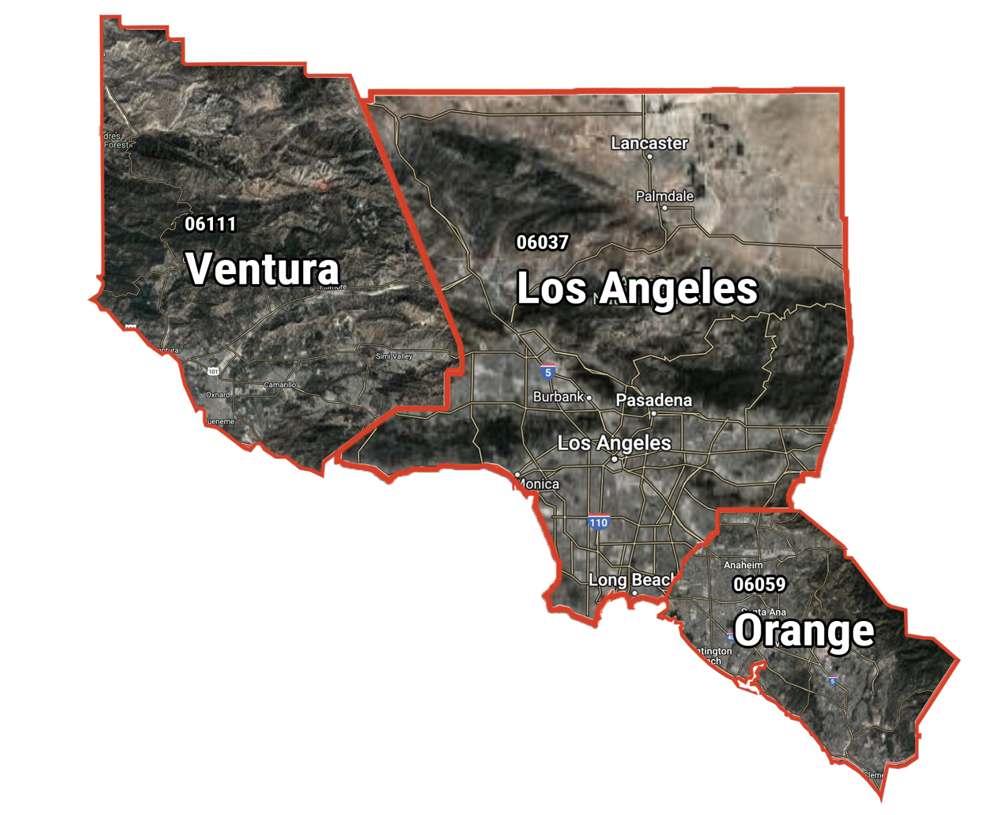

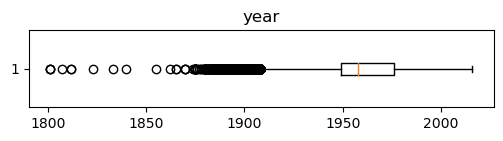

Number of results in lower quartile: 17871
Number of results in inner quartile: 2122364
Number of results in upper quartile: 0


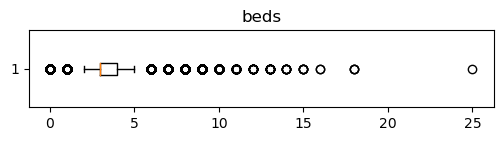

Number of results in lower quartile: 27292
Number of results in inner quartile: 2081444
Number of results in upper quartile: 31499


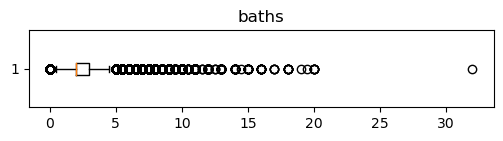

Number of results in lower quartile: 4274
Number of results in inner quartile: 2081423
Number of results in upper quartile: 54538


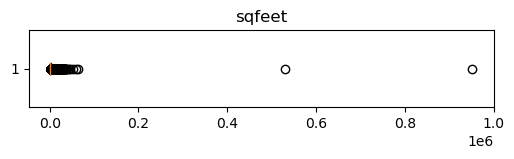

Number of results in lower quartile: 0
Number of results in inner quartile: 2044003
Number of results in upper quartile: 96232


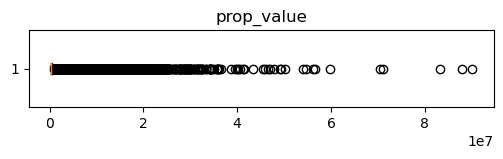

Number of results in lower quartile: 0
Number of results in inner quartile: 2002735
Number of results in upper quartile: 137500


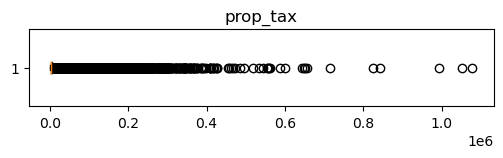

Number of results in lower quartile: 0


In [1]:
from wrangle import box_plotter, wrangle_zillow

df = wrangle_zillow()

box_plotter(df)